In [3]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2
%load_ext snakeviz
import logging
import os
import pathlib
import pickle
import string

import invert4geom
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import pygmt
import seaborn as sns
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles, fetch
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import plotting, utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The snakeviz extension is already loaded. To reload it, use:
  %reload_ext snakeviz


In [4]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

# plot_region = vd.pad_region(inversion_region, -3*spacing)
plot_region = inversion_region

true_density_contrast = 1476

bathymetry, basement, _ = RIS_synth.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
    plot_topography=False,
    plot_gravity=False,
)

buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# clip to plot region
bathymetry = bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
basement = basement.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

INFO:root:converting to be reference to the WGS84 ellipsoid
INFO:root:spacing larger than original, filtering and resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

# Load results of notebooks 01-07

In [190]:
damping_studies = []
density_studies = []
optimal_results = []

# uncertainty_results = []
constraint_points_dfs = []
sensitivity_results = []
final_bathymetries = []
final_uncertainties = []
final_stochastic_means = []
inversion_titles = [
    # "Best case scenario",
    "Best case scenario",  # "Unknown density",
    "Errors in constraints",
    "Errors in gravity",
    "Airborne survey",
    "Regional gravity field",
    "Realistic scenario",
]

for i in range(2, 8):
    # get names for various studies / results
    damping_study_fname = (
        f"../../results/Ross_Sea_0{i}_damping_cv_damping_cv_study.pickle"
    )
    if i >= 6:
        density_study_fname = f"../../results/Ross_Sea_0{i}_density_cv_kfolds_study.pickle"
    else:
        density_study_fname = (
            f"../../results/Ross_Sea_0{i}_density_cv_zref_density_cv_study.pickle"
        )
    optimal_results_fname = f"../../results/Ross_Sea_0{i}_optimal_results.pickle"

    # open studies
    with pathlib.Path(damping_study_fname).open("rb") as f:
        damp_study = pickle.load(f)
    with pathlib.Path(density_study_fname).open("rb") as f:
        dens_study = pickle.load(f)
    with pathlib.Path(optimal_results_fname).open("rb") as f:
        optimal_result = pickle.load(f)

    topo_results, _, _, _ = optimal_result

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    uncertainty_ds = xr.load_dataset(f"../../results/Ross_Sea_0{i}_uncertainty.nc")
    sensitivity_ds = xr.load_dataset(f"../../results/Ross_Sea_0{i}_sensitivity.nc")

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_uncert = sensitivity_ds.full_stdev.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_stochastic_mean = uncertainty_ds.weighted_mean.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    # add to lists
    damping_studies.append(damp_study)
    density_studies.append(dens_study)
    optimal_results.append(optimal_result)
    # uncertainty_results.append(uncertainty_ds)
    constraint_points_dfs.append(
        pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")
    )
    sensitivity_results.append(
        xr.load_dataset(f"../../results/Ross_Sea_0{i}_sensitivity.nc")
    )
    final_bathymetries.append(final_bathymetry)
    final_stochastic_means.append(final_stochastic_mean)
    final_uncertainties.append(final_uncert)

In [191]:
starting_bathymetry_no_errors = optimal_results[0][0].set_index(["northing", "easting"]).to_xarray().starting_topo
starting_bathymetry_no_errors = starting_bathymetry_no_errors.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

In [144]:
print(f"Starting bathymetry error (no constraint point errors): {np.abs(bathymetry - starting_bathymetry_no_errors).mean().values}")

Starting bathymetry error (no constraint point errors): 20.085465471543014


In [6]:
ibcso_points_gdf, ibcso_polygons_gdf = fetch.ibcso_coverage(
    region=plot_region,
)

In [7]:
ibcso_points_gdf

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10,10,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10,10,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10,10,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10,10,POINT (109042.600 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10,10,POINT (108798.689 -1588330.430),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
53,NGA_various.xyz,13,5,POINT (46074.726 -1401160.721),46074.726123,-1.401161e+06
36,NBP93_8.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
37,NBP93_7.xyz,10,10,POINT (47246.316 -1401134.187),47246.316386,-1.401134e+06
36,NBP93_8.xyz,10,10,POINT (47393.275 -1401065.810),47393.275443,-1.401066e+06


In [8]:
from RIS_gravity_inversion import ice_shelf_stats

polygon_points = ice_shelf_stats.polygons_to_points(
    ibcso_polygons_gdf,
    spacing=500,
)
polygon_points

,geometry,easting,northing
0,POINT (-39500.000 -1509160.059),-39500.000000,-1.509160e+06
1,POINT (-39500.000 -1508660.059),-39500.000000,-1.508660e+06
2,POINT (-39500.000 -1508160.059),-39500.000000,-1.508160e+06
3,POINT (-39500.000 -1507660.059),-39500.000000,-1.507660e+06
4,POINT (-39500.000 -1507160.059),-39500.000000,-1.507160e+06
...,...,...,...
9870,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,POINT (-38785.390 -1504419.603),-38785.389511,-1.504420e+06
9872,POINT (-39190.260 -1504422.531),-39190.259674,-1.504423e+06
9873,POINT (-39595.130 -1504425.458),-39595.129837,-1.504425e+06


In [9]:
total_ibcso_points = pd.concat([ibcso_points_gdf, polygon_points])
total_ibcso_points

,dataset_name,dataset_tid,weight,geometry,easting,northing
3,NBP94_6.xyz,10.0,10.0,POINT (109770.251 -1589039.712),109770.251441,-1.589040e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109541.648 -1588891.732),109541.648463,-1.588892e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109295.696 -1588705.992),109295.696152,-1.588706e+06
3,NBP94_6.xyz,10.0,10.0,POINT (109042.600 -1588513.108),109042.599997,-1.588513e+06
3,NBP94_6.xyz,10.0,10.0,POINT (108798.689 -1588330.430),108798.688784,-1.588330e+06
...,...,...,...,...,...,...
9870,NaN,NaN,NaN,POINT (-38380.519 -1504416.675),-38380.519348,-1.504417e+06
9871,NaN,NaN,NaN,POINT (-38785.390 -1504419.603),-38785.389511,-1.504420e+06
9872,NaN,NaN,NaN,POINT (-39190.260 -1504422.531),-39190.259674,-1.504423e+06
9873,NaN,NaN,NaN,POINT (-39595.130 -1504425.458),-39595.129837,-1.504425e+06


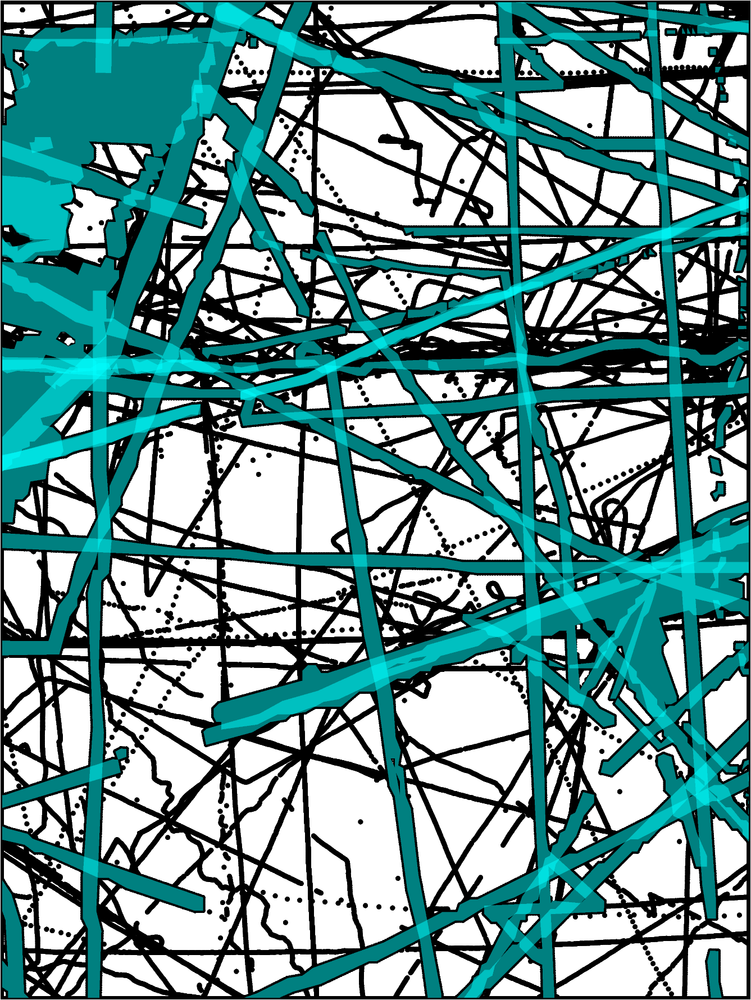

In [10]:
fig = maps.basemap(
    region = plot_region,
    points = total_ibcso_points,
    points_style="p2p"
)
fig.plot(
    ibcso_polygons_gdf,
    fill="cyan",
    close=True,
    transparency=50,
)
fig.show()

In [11]:
# calculate gravity data median distance
grd = fetch.resample_grid(bathymetry, spacing=100, verbose="q").rename({"x": "easting", "y": "northing"})

min_dist = utils.dist_nearest_points(
    total_ibcso_points,
    grd,
).min_dist
print(f"mean minimum distance: {int(min_dist.mean().values)} m")
print(f"median minimum distance: {int(min_dist.median().values)} m")

mean minimum distance: 788 m
median minimum distance: 359 m


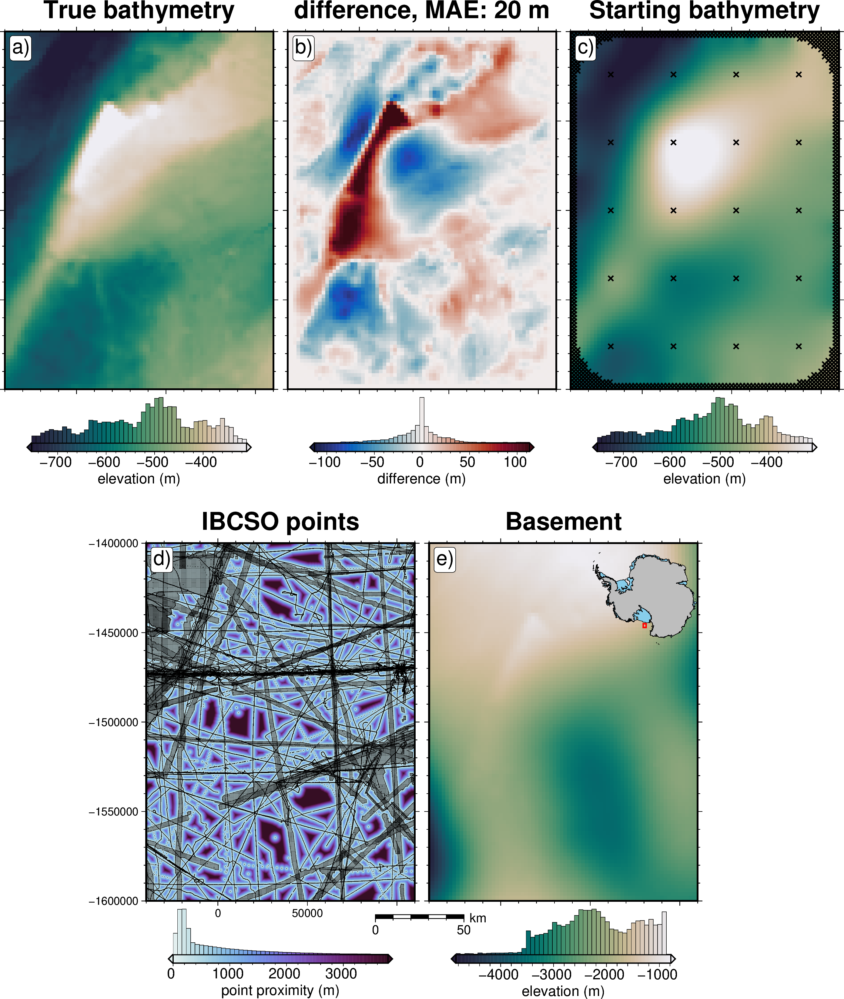

In [12]:
####
# Bathymetry
####
bathy_lims = polar_utils.get_combined_min_max([bathymetry, starting_bathymetry_no_errors], robust=True)
fig = maps.plot_grd(
    bathymetry,
    fig_height=10,
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    title="True bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="TL",
    text=f"a)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Difference with starting
####
dif = bathymetry - starting_bathymetry_no_errors
fig = maps.plot_grd(
    dif,
    fig=fig,
    origin_shift="x",
    region=plot_region,
    title=f"difference, MAE: {round(np.abs(dif.values).mean())} m",
    cbar_label="difference (m)",
    cbar_font="18p,Helvetica,black",
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(dif, robust=True, absolute=True, robust_percentiles=(.01, .99)),
    # robust=True,
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text=f"b)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Starting bathymetry
####
fig = maps.plot_grd(
    starting_bathymetry_no_errors,
    fig=fig,
    origin_shift="x",
    region=plot_region,
    title="Starting bathymetry",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    cmap="rain",
    reverse_cpt=True,
    cpt_lims=bathy_lims,
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    points=constraint_points_dfs[0],
    points_style="x0.2c",
    points_pen="1p,black",
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text=f"c)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Min distance
####
fig = maps.plot_grd(
    min_dist,
    fig=fig,
    origin_shift="both",
    xshift_amount=-1.5,
    region=plot_region,
    title="IBCSO points",
    cbar_label="point proximity (m)",
    cbar_font="18p,Helvetica,black",
    cmap="dense",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cpt_lims=[0,polar_utils.get_min_max(min_dist, robust=True,)[1]],
    # points=ibcso_points_gdf,
    points=total_ibcso_points,
    points_style="p",
    points_fill="black",
)
# fig.plot(
#     ibcso_polygons_gdf,
#     fill="black",
#     close=True,
#     transparency=50,
# )
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text=f"d)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)
####
# Basement
####
fig = maps.plot_grd(
    basement,
    fig=fig,
    origin_shift="x",
    fig_height=10,
    cmap="rain",
    reverse_cpt=True,
    # robust=True,
    title="Basement",
    cbar_label="elevation (m)",
    cbar_font="18p,Helvetica,black",
    frame=["nsew", "xaf10000", "yaf10000"],
    hist=True,
    # hist_bin_num=50,
    cbar_yoffset=1.5,
    scalebar=True,
    scale_position="jBL+o-1.5c/-.6c",
    scale_length=50,
    inset=True,
    inset_pos="TR",
    inset_width=.4,
)
# add subplot label
fig.text(
    position="TL",
    justify="TL",
    text=f"e)",
    font="16p,Helvetica,black",
    offset="j.2c",
    no_clip=True,
    fill="white",
    clearance="+tO",
    pen=True,
)

fig.savefig("../../paper/figures/Ross_Sea_location_figure.png", dpi=500)
fig.show()

# Plotting functions

In [11]:
profile_start = [plot_region[0], plot_region[3]]
profile_end = [plot_region[1], plot_region[2]]

In [12]:
def inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points=None,
):
    lims = polar_utils.get_min_max(bathymetry)

    fig = maps.plot_grd(
        bathymetry,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=lims,
        title="True bathymetry",
        cbar_label="elevation (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nSWe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        points=constraint_points,
        points_style="x.3c",
    )

    dif = bathymetry - final_bathymetry
    dif_lims = polar_utils.get_min_max(dif, robust=True)
    fig = maps.plot_grd(
        dif,
        fig_height=10,
        cmap="balance+h0",
        cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
        title=f"RMSE: {round(utils.rmse(dif),1)} m",
        cbar_label="difference (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="xshift",
        xshift_amount=1.01,
        scalebar=True,
        scale_position="jBL+o0c/-.6c",
        points=constraint_points,
        points_style="x.3c",
    )
    # add transect line
    # plot profiles location, and endpoints on map
    fig.plot(
        vd.line_coordinates(profile_start, profile_end, size=100),
        pen="2p,black",
    )
    fig.text(
        x=profile_start[0],
        y=profile_start[1],
        text="A",
        fill="white",
        font="12p,Helvetica,black",
        justify="CM",
        clearance="+tO",
        no_clip=True,
    )
    fig.text(
        x=profile_end[0],
        y=profile_end[1],
        text="A' ",
        fill="white",
        font="12p,Helvetica,black",
        justify="CM",
        clearance="+tO",
        no_clip=True,
    )

    # plot the starting bathymetry
    fig = maps.plot_grd(
        final_bathymetry,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=lims,
        title="Inverted bathymetry",
        cbar_label="elevation (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nSwe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift="xshift",
        xshift_amount=1.01,
        points=constraint_points,
        points_style="x.3c",
    )
    fig.show()

In [13]:
def inverted_bathymetry_profile(
    inversion_results,
    constraint_points=None,
):
    topo_results = inversion_results[0]
    grav_results = inversion_results[1]

    prism_ds = topo_results.set_index(["northing", "easting"]).to_xarray()
    grav_ds = grav_results.set_index(["northing", "easting"]).to_xarray()

    initial_topo = prism_ds.starting_topo.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_topo = prism_ds.topo.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    cols = [s for s in grav_results.columns.to_list() if "_initial_misfit" in s]
    initial_residual = grav_ds.starting_gravity.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    cols = [s for s in grav_results.columns.to_list() if "_forward_grav" in s]
    final_forward = grav_ds[cols[-1]].sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    observed = grav_ds.gravity_anomaly.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    # topography data dictionary
    topo_names = [
        "Starting bed",
        "Inverted bed",
        "True bed",
    ]
    topo_grids = [
        initial_topo,
        final_topo,
        bathymetry,
    ]
    layers_dict = profiles.make_data_dict(
        names=topo_names,
        grids=topo_grids,
        colors=[  # picked from https://github.com/OrdnanceSurvey/GeoDataViz-Toolkit/blob/master/Colours/GDV%20colour%20palettes%200.7.pdf
            "255/31/91",  # red, ff1f5b
            "black",
            "0/154/222",  # blue, 009ade
        ],
    )

    # gravity data dictionary
    data_names = [
        "Initial forward gravity",
        "Final forward gravity",
        "Observed gravity",
    ]
    data_grids = [
        initial_residual,
        final_forward + grav_ds.reg,
        observed,
    ]
    data_dict = profiles.make_data_dict(
        names=data_names,
        grids=data_grids,
        colors=[  # picked from https://github.com/OrdnanceSurvey/GeoDataViz-Toolkit/blob/master/Colours/GDV%20colour%20palettes%200.7.pdf
            "255/31/91",  # red, ff1f5b
            "black",
            "0/154/222",  # blue, 009ade
        ],
    )

    fig, df_layers, df_data = profiles.plot_profile(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=8,
        data_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc="jBC+jBC",  # +o0c/.4c",
        data_legend_box="+gwhite+c0c+p1p",
        data_buffer=0.1,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+lgravity (mGal)"],
        # data_frame=["nesW", "xafg", "yag+lgravity (mGal)"],
        data_pen_style=[None, None, "4_2:2p"],
        data_pen_thickness=[2, 2, 2],
        share_yaxis=True,
        layers_dict=layers_dict,
        layers_legend_loc="jBC+jBC",  # +o0c/-.2c",
        layers_legend_box="+gwhite+c0c+p1p",
        fill_layers=False,
        layers_frame=["nesW", "xafg", "yag+lelevation (m)"],
        layers_pen_thickness=[2, 2, 2],
        layers_pen_style=[None, None, "4_2:2p"],
        start_label="A",
        end_label="A' ",
        start_end_pen=None,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            topo_results.set_index(["northing", "easting"]).to_xarray(),
        )

        # set y height in data units for add dist to constraint points
        data_max = df_layers.drop(columns=["x", "y", "dist"]).max().max()

        df_layers = profiles.sample_grids(
            df_layers, min_dist, interpolation="b", sampled_name="min_dist"
        )

        # set color limits
        series = [2e3, 15e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".5c",
        )
        fig.plot(
            x=df_layers.dist,
            y=np.ones_like(df_layers.dist) * data_max,
            style="c0.1c",
            fill=df_layers.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.5c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )
    fig.show()
    return fig

In [14]:
def sensitivity_plot(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    num_in_top_row=2,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
    # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

    fig_height = 9
    for i, g in enumerate(grids):
        xshift_amount = 1

        if i == 0:
            fig = None
            origin_shift = "initialize"
            scalebar = True
        elif i == num_in_top_row:
            origin_shift = "both_shift"
            xshift_amount = -((len(grids) - 2) / 2)
            scalebar = False
        else:
            origin_shift = "xshift"
            scalebar = False

        if i < 2:  # noqa: SIM108
            cpt_lims = first_2_lims
        else:
            cpt_lims = polar_utils.get_min_max(g, robust=True)

        fig = maps.plot_grd(
            grid=g,
            fig_height=fig_height,
            title=titles[i],
            title_font="16p,Helvetica,black",
            cmap="thermal",
            cpt_lims=cpt_lims,
            cbar_label=f"uncertainty (m), mean: {round(np.nanmean(np.abs(g).values),1)}",
            cbar_font="18p,Helvetica,black",
            hist=True,
            hist_bin_num=50,
            cbar_yoffset=1,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=-1.02,
            scalebar=scalebar,
            scale_length=50,
            scale_position="jBR+o0c/-.6c",
            points=constraint_points[~constraint_points.inside],
            points_style="p1p",
        )
        fig.plot(
            x=constraint_points[constraint_points.inside].easting,
            y=constraint_points[constraint_points.inside].northing,
            style="c.15c",
            fill="white",
            pen="1p,black",
        )


        if i == 0:
            # plot profiles location, and endpoints on map
            fig.plot(
                vd.line_coordinates(profile_start, profile_end, size=100),
                pen="2p,black",
            )
            fig.text(
                x=profile_start[0],
                y=profile_start[1],
                text="A",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            fig.text(
                x=profile_end[0],
                y=profile_end[1],
                text="A' ",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            # add subplot label
        #     fig.text(
        #         position="TL",
        #         justify="TL",
        #         text=f"{string.ascii_lowercase[i]})",
        #         font="16p,Helvetica,black",
        #         offset="j.5c/.2c",
        #         no_clip=True,
        #         fill="white",
        #         clearance="+tO",
        #         pen=True,
        #     )
        # else:
        # add subplot label
        fig.text(
            position="TL",
            justify="TL",
            text=f"{string.ascii_lowercase[i]})",
            font="16p,Helvetica,black",
            offset="j.2c",
            no_clip=True,
            fill="white",
            clearance="+tO",
            pen=True,
        )
    if fname is not None:
        fig.savefig(fname)
    fig.show()

    return fig

In [15]:
def sensitivity_profile(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    data_legend_loc="jTR+jTL+o1.5c/0c",
    **kwargs,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    data_dict = profiles.make_data_dict(
        names=titles,
        grids=grids,
        colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
            "216/48/52",  # red, d83034
            "0/58/125",  # dark blue, 003a7d
            "78/203/141",  # green, 4ecb8d
            "199/1/255",  # purple, c701ff
            "255/157/58",  # orange, ff9d3a
            "0/141/255",  # med blue, 008dff
            "255/115/182",  # pink, ff73b6
            "249/232/88",  # yellow, f9e858
        ],
    )

    fig, df_data = profiles.plot_data(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc=data_legend_loc,
        # data_legend_box="+gwhite",
        data_buffer=0.01,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
        # data_pen_style=[None,None,"4_2:2p"],
        data_pen_thickness=[2, 1.9, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2],
        share_yaxis=True,
        start_label="A",
        end_label="A' ",
        **kwargs,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            grids[0],
        )

        # set y height in data units for add dist to constraint points
        data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

        if kwargs.get("data_ylims") is not None:
            data_max = kwargs["data_ylims"][1]

        df_data = profiles.sample_grids(
            df_data, min_dist, interpolation="b", sampled_name="min_dist"
        )
        # set color limits
        series = [2e3, 15e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".2c",
        )
        fig.plot(
            x=df_data.dist,
            y=np.ones_like(df_data.dist) * data_max,
            style="c0.1c",
            fill=df_data.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.2c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )

    if fname is not None:
        fig.savefig(fname)
    fig.show()

# 1: with density CV

In [17]:
i = 2
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

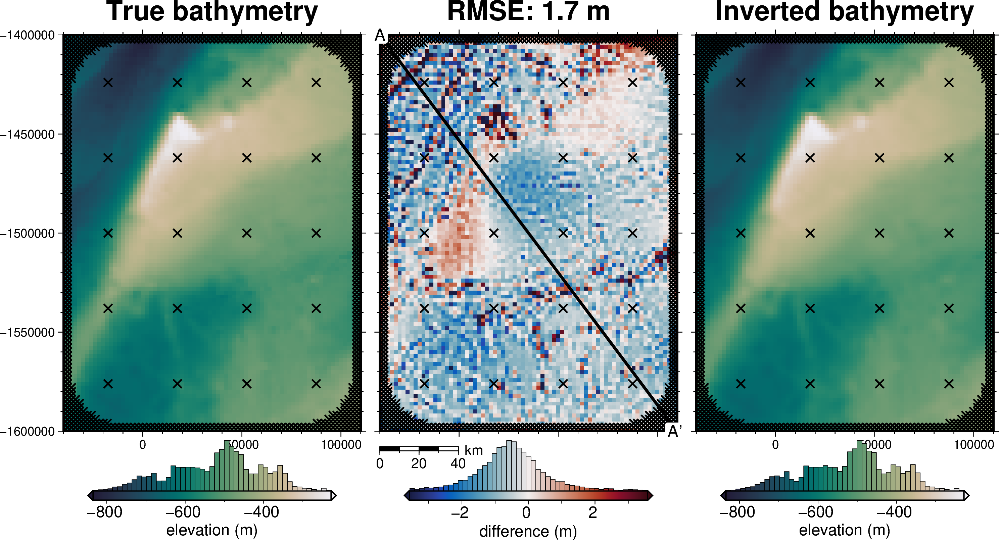

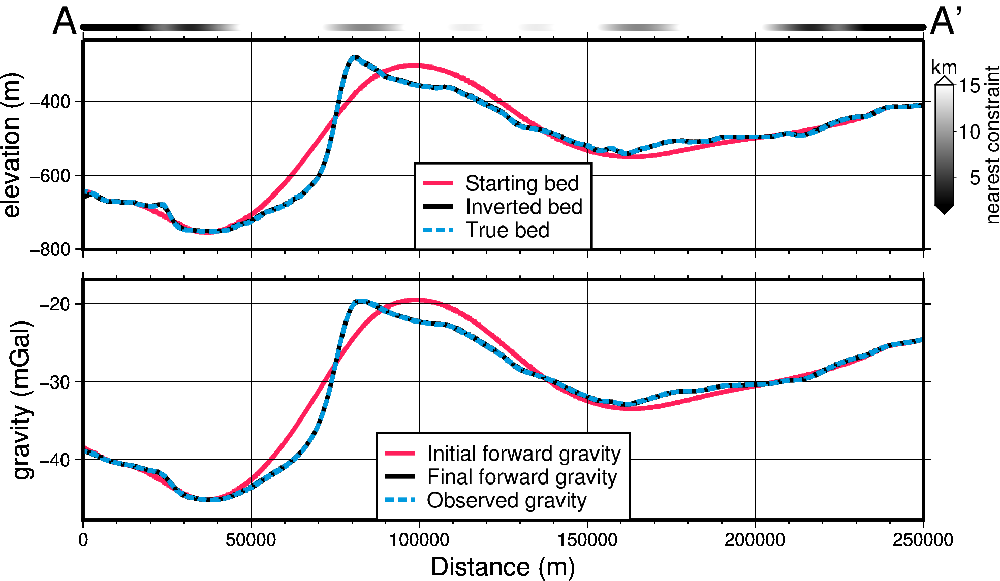

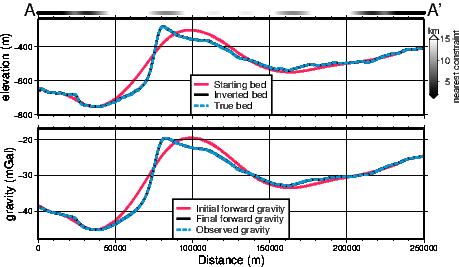

In [12]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [13]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(31.97353342548336)

In [14]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(20.08546547)

In [42]:
np.abs(
    bathymetry - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(1.12856051)

In [41]:
np.abs(
    bathymetry - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(1.07906032)

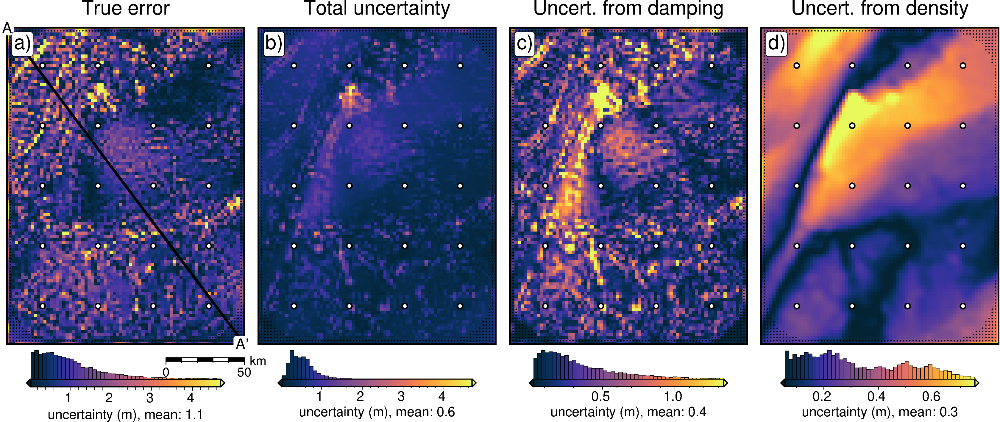

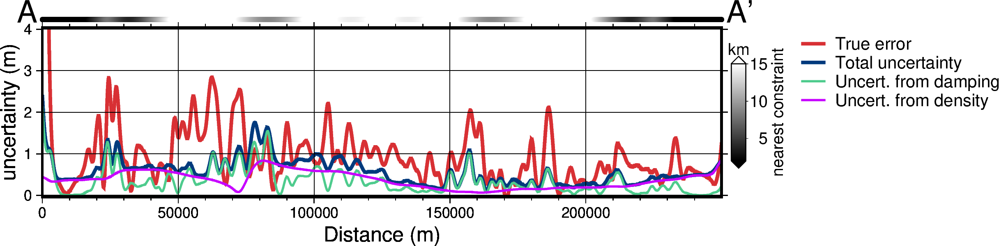

In [23]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname="../../paper/figures/Ross_Sea_01_sensitivity.png",
)

sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 4],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_01_sensitivity_profiles.png",
)

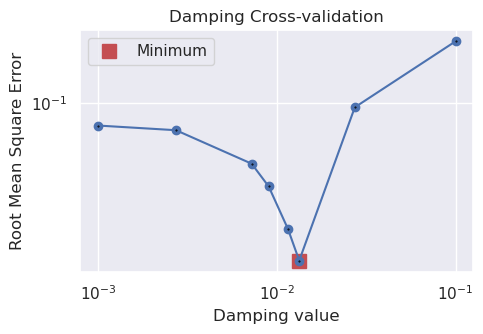

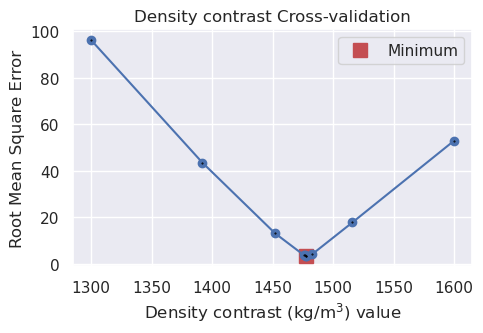

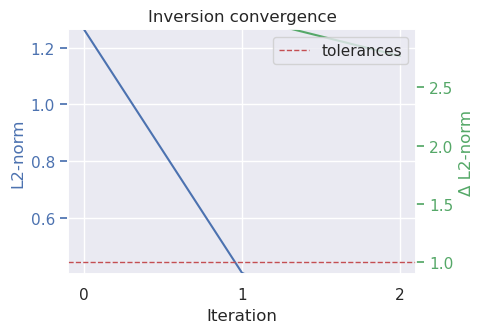

In [28]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 2: with constraint uncertainty

In [24]:
i = 3
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

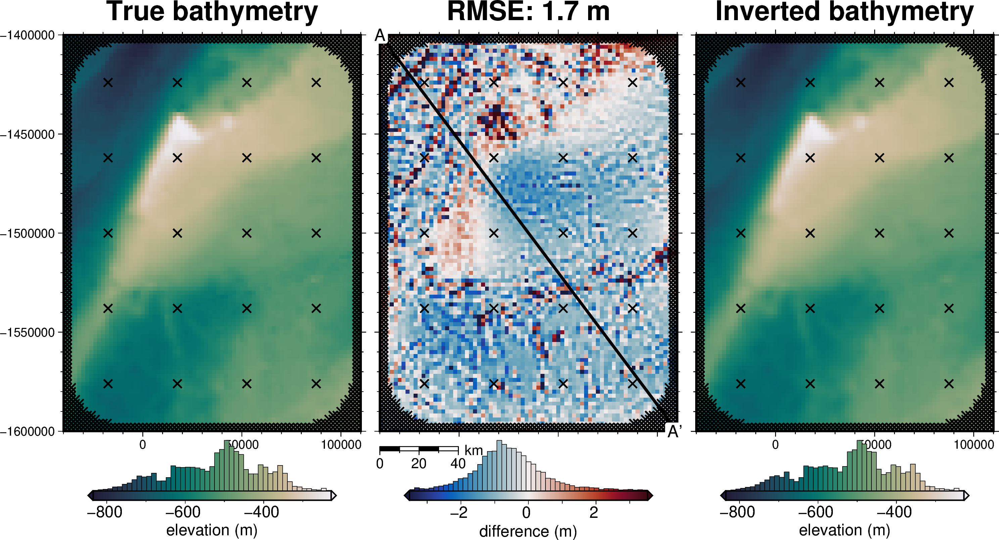

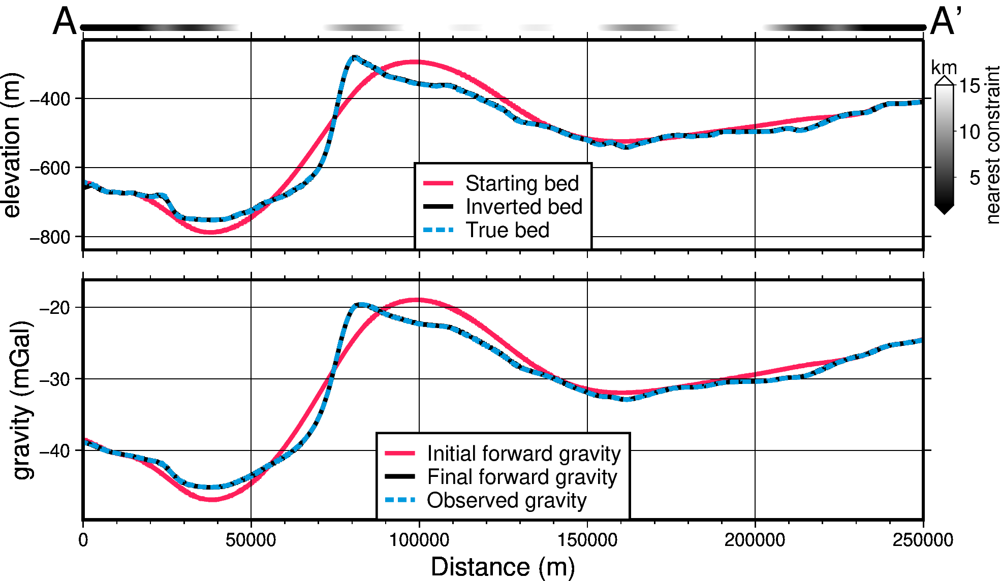

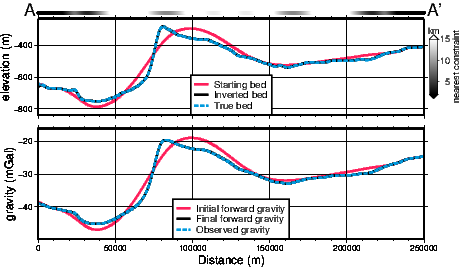

In [30]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [31]:
constraint_points.describe()

,northing,easting,true_upward,upward,true_uncert,uncert,starting_bathymetry,dif,inverted_topography
count,8.640000e+02,864.000000,864.000000,864.000000,864.000000,864.000000,864.000000,864.000000,864.000000
mean,-1.500000e+06,35000.000000,-555.730565,-555.622104,0.592406,0.586983,-555.622049,-0.108516,-555.978301
std,7.996291e+04,62837.916165,110.176891,110.551895,3.945790,3.934578,110.550087,3.800683,109.633406
min,-1.600000e+06,-40000.000000,-834.579163,-834.579163,0.000000,0.000000,-834.579163,-52.064999,-826.208618
25%,-1.590000e+06,-36000.000000,-653.745163,-654.132172,0.000000,0.000000,-654.132172,0.000000,-656.747879
50%,-1.500000e+06,35000.000000,-550.741394,-550.239105,0.000000,0.000000,-550.239105,0.000000,-551.943787
75%,-1.410000e+06,106000.000000,-455.580765,-455.001720,0.000000,0.000000,-455.008857,0.000000,-456.667572
max,-1.400000e+06,110000.000000,-298.322685,-297.712133,37.902128,39.498484,-297.861384,57.486448,-298.053173


In [32]:
# spline = invert4geom.utils.best_spline_cv(
#     coordinates=(constraint_points.easting, constraint_points.northing),
#     data=constraint_points.true_uncert,
# )

# constraints_error = spline.grid(
#     region=plot_region,
#     spacing=spacing,
# ).scalars
# fig = maps.plot_grd(
#     constraints_error,
#     points=constraint_points,
#     cmap="thermal",
# )
# fig.show()

In [33]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(34.91500052777304)

In [34]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(23.09434071)

In [36]:
np.abs(
    bathymetry - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(1.13353679)

In [37]:
np.abs(
    bathymetry - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(1.3188706)

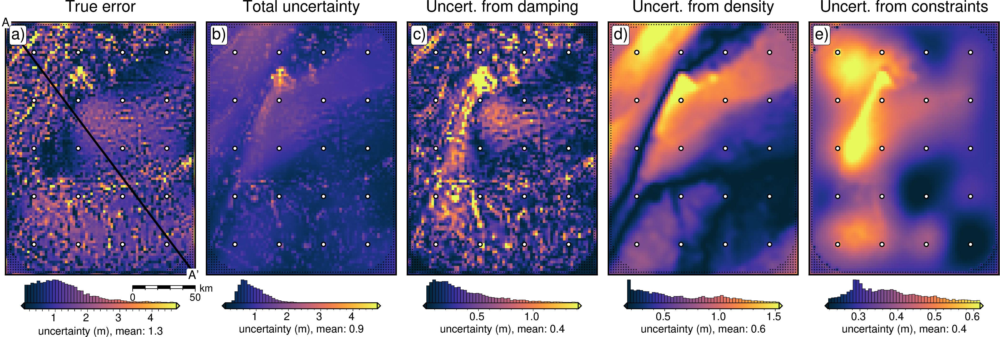

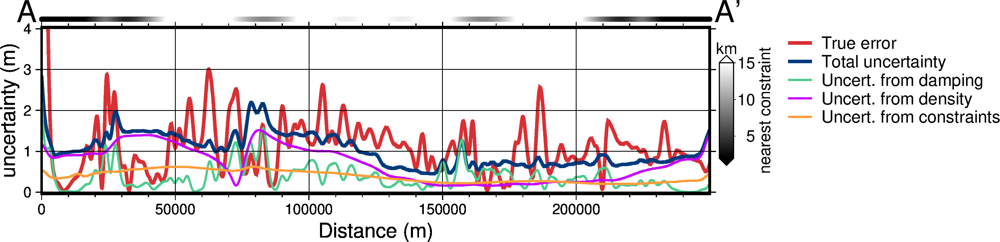

In [25]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from constraints",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.constraints_stdev,
]

sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_02_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 4],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_02_sensitivity_profiles.png",
)

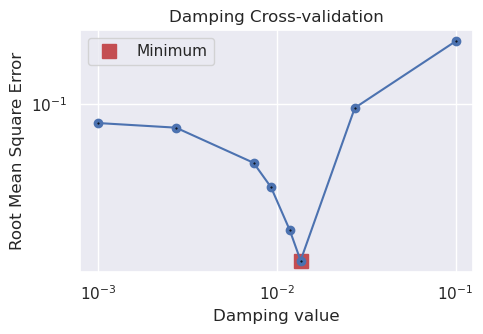

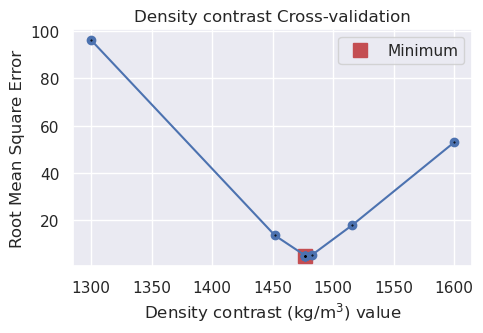

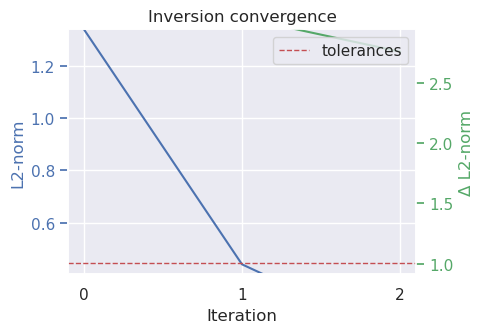

In [38]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 3: with noise

In [26]:
i = 4
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

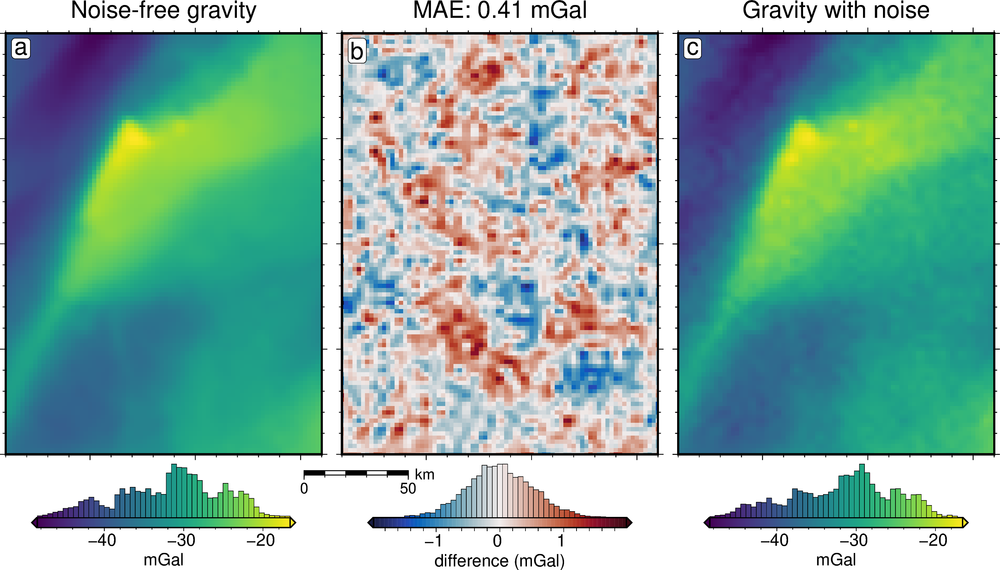

In [111]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(dif, absolute=True,),
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"MAE: {round(np.nanmean(np.abs(dif)),2)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=50,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity with noise",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_03_grav_error.png")
fig.show()

In [112]:
grav_error = np.abs(grav_df.noise_free_disturbance - grav_df.disturbance)
grav_error.describe()

count    7676.000000
mean        0.410994
std         0.315663
min         0.000068
25%         0.160007
50%         0.343441
75%         0.592535
max         1.981544
dtype: float64

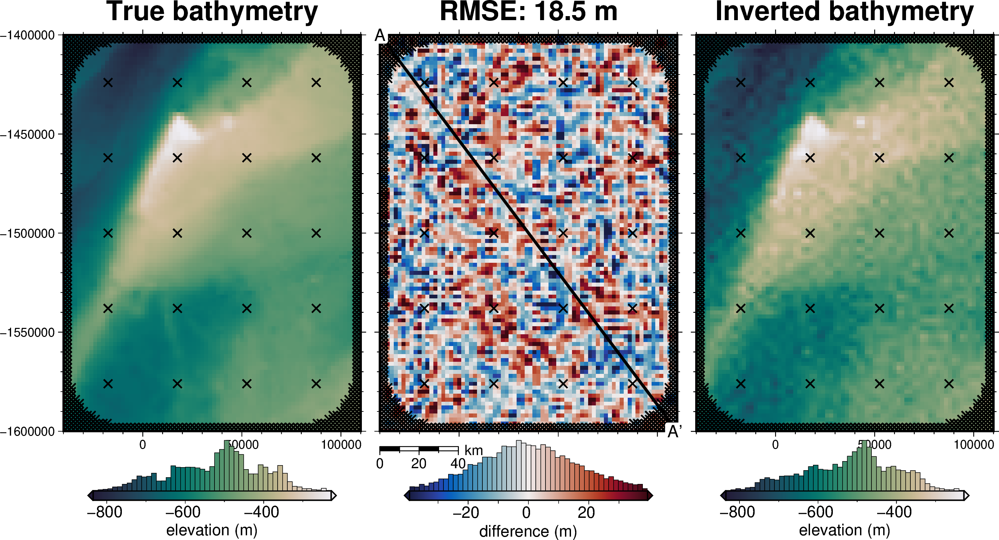

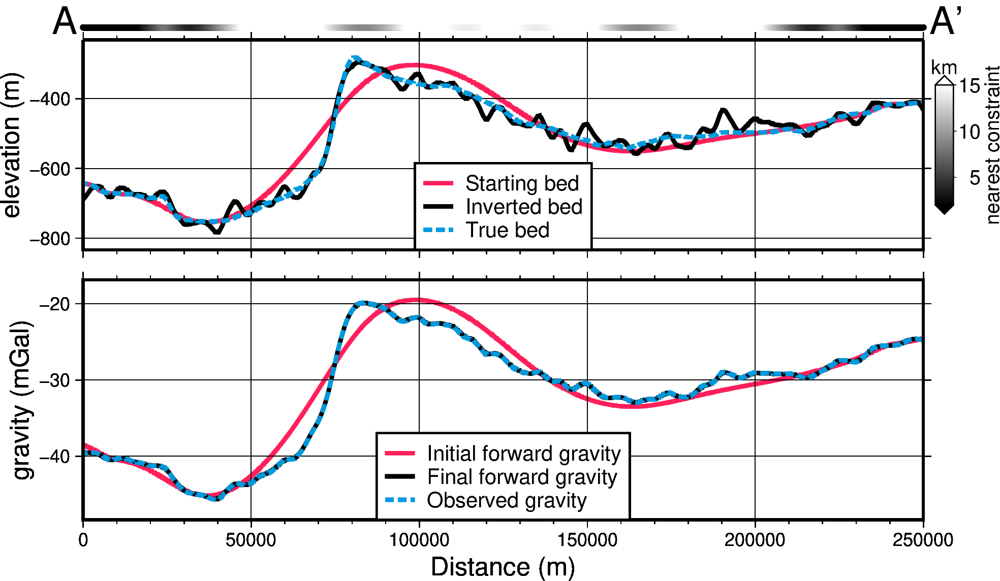

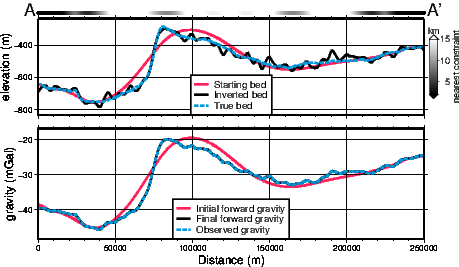

In [42]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [43]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(31.97353342548336)

In [44]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(20.08546547)

In [31]:
np.abs(
    bathymetry - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(14.1286871)

In [32]:
np.abs(
    bathymetry - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(14.29009244)

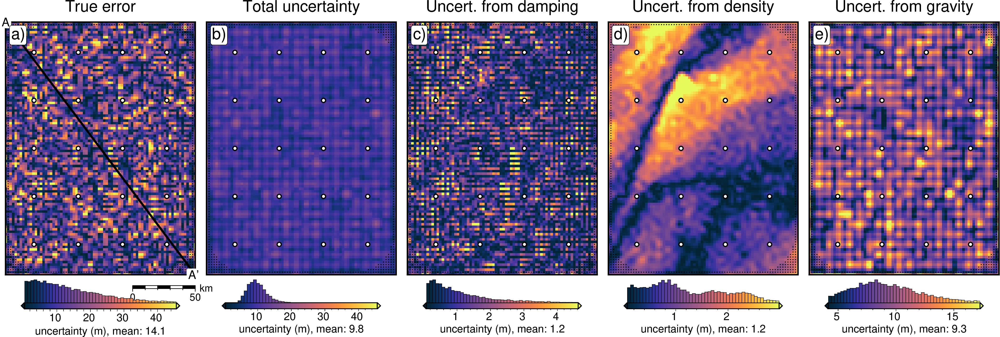

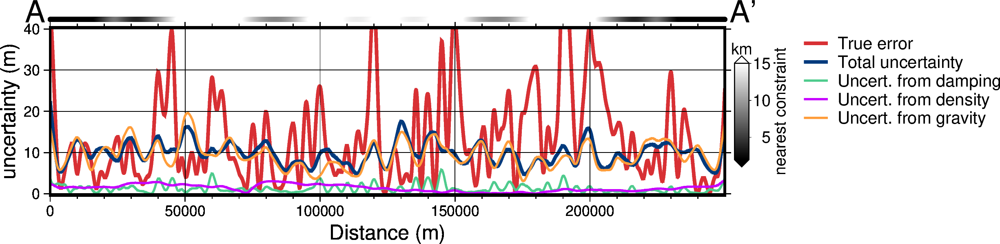

In [27]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from gravity",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.gravity_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_03_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 40],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_03_sensitivity_profiles.png",
)

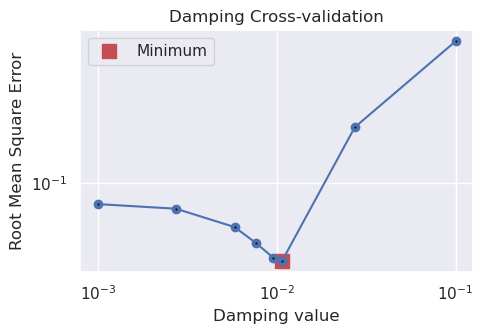

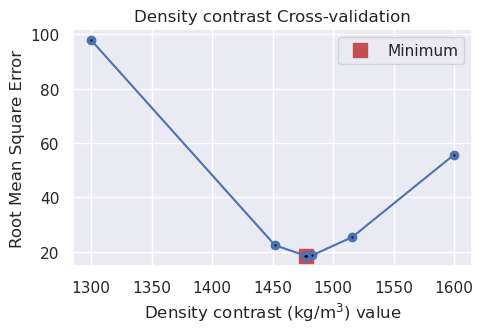

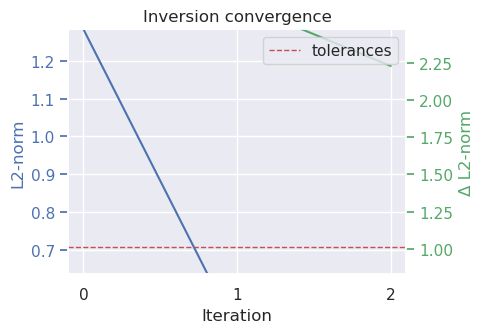

In [48]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 4: with airborne survey

In [28]:
i = 5
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

# grav_df = inversion_results[1]

grav_df = pd.read_csv(f"../../results/Ross_Sea_0{i}_grav_df.csv")

grav_survey_df = pd.read_csv(f"../../results/Ross_Sea_0{i}_grav_survey_df.csv")

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [115]:
grav_df.describe()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,starting_gravity,eqs_gravity_anomaly,gravity_anomaly_deterministic,misfit,reg,res,predicted_grav,eqs_uncert,gravity_anomaly_eqs_mean,gravity_anomaly,uncert
count,7.676000e+03,7676.000000,7676.0,7676.000000,7676.0,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000,7676.000000
mean,-1.500000e+06,35000.000000,1000.0,-31.727297,0.0,-31.727297,-31.727297,-31.262449,-31.703596,-31.703596,-0.433530,-0.270618,-0.162912,-31.695719,0.076621,-31.695979,-31.695979,0.076621
std,5.831332e+04,43877.680138,0.0,6.458138,0.0,6.458138,6.458138,6.055043,6.429377,6.429377,1.597667,0.000000,1.597667,6.419110,0.096020,6.419724,6.419724,0.096020
min,-1.600000e+06,-40000.000000,1000.0,-48.457766,0.0,-48.457766,-48.457766,-48.076558,-48.112127,-48.112127,-5.026830,-0.270618,-4.756211,-48.148099,0.002529,-48.069332,-48.069332,0.002529
25%,-1.550000e+06,-2500.000000,1000.0,-36.286368,0.0,-36.286368,-36.286368,-34.823403,-36.302251,-36.302251,-1.096810,-0.270618,-0.826192,-36.284010,0.026175,-36.299568,-36.299568,0.026175
50%,-1.500000e+06,35000.000000,1000.0,-31.030073,0.0,-31.030073,-31.030073,-30.700859,-30.978861,-30.978861,-0.431839,-0.270618,-0.161221,-30.978725,0.045853,-30.981339,-30.981339,0.045853
75%,-1.450000e+06,72500.000000,1000.0,-27.279068,0.0,-27.279068,-27.279068,-27.204122,-27.240727,-27.240727,0.082383,-0.270618,0.353001,-27.223458,0.084789,-27.231295,-27.231295,0.084789
max,-1.400000e+06,110000.000000,1000.0,-16.585801,0.0,-16.585801,-16.585801,-17.373334,-16.614562,-16.614562,8.671939,-0.270618,8.942557,-16.859292,0.983154,-16.923721,-16.923721,0.983154


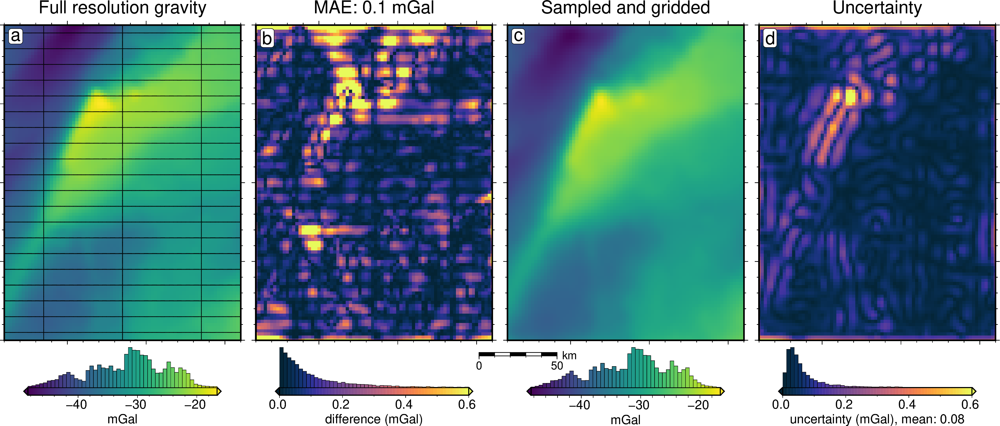

In [116]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
dif = np.abs(dif)
dif_lims = (0, 0.6)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="thermal",
    cpt_lims=dif_lims,
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=50,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    # robust=True,
    title="Uncertainty",
    title_font="16p,Helvetica,black",
    # cbar_label=f"mGal, mean: {}",
    cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_04_grav_error.png")
fig.show()

In [117]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.148649
std         0.276275
min         0.000004
25%         0.027648
50%         0.068941
75%         0.161308
max         4.504920
dtype: float64

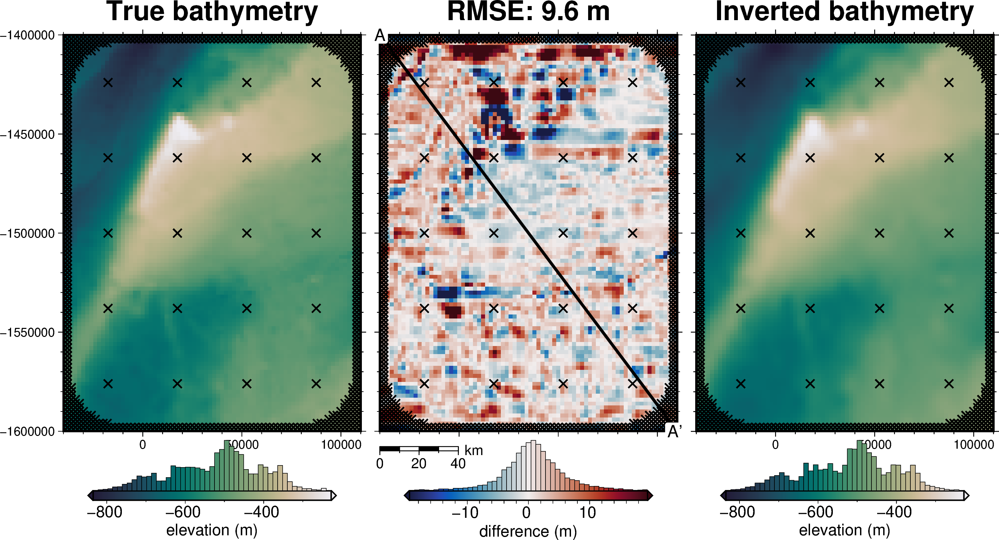

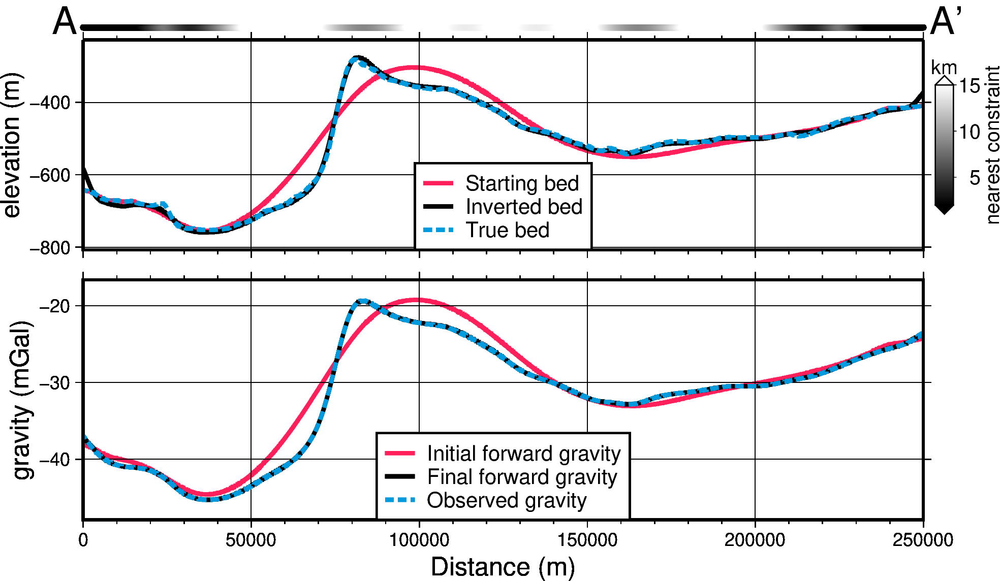

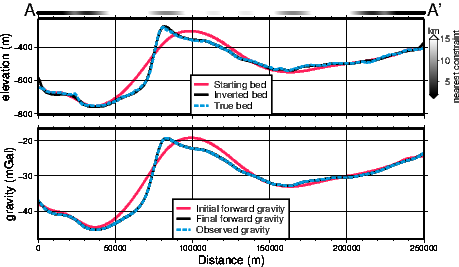

In [53]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [54]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(31.97353342548336)

In [55]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(20.08546547)

In [45]:
np.abs(
    bathymetry
    - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(4.94946395)

In [46]:
np.abs(
    bathymetry
    - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(5.30901696)

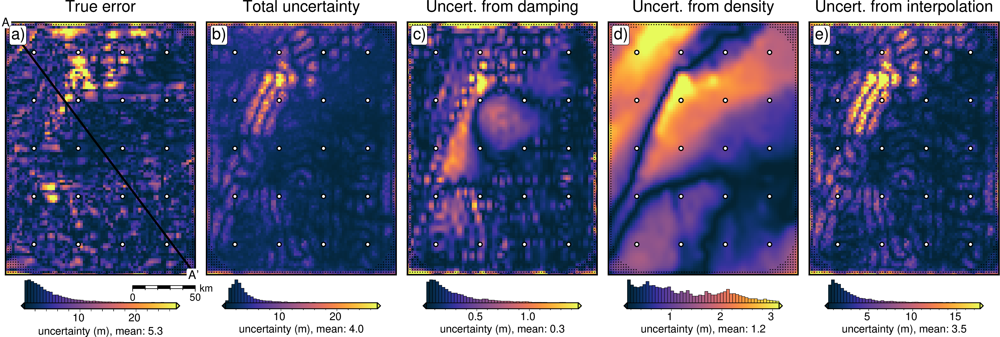

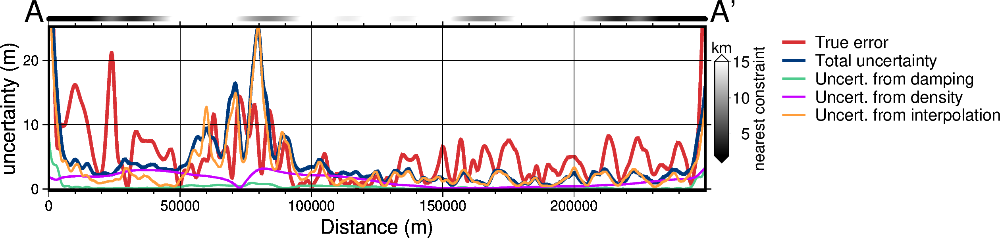

In [32]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from interpolation",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds["equivalent source gridding_stdev"],
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_04_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 25],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_04_sensitivity_profiles.png",
)

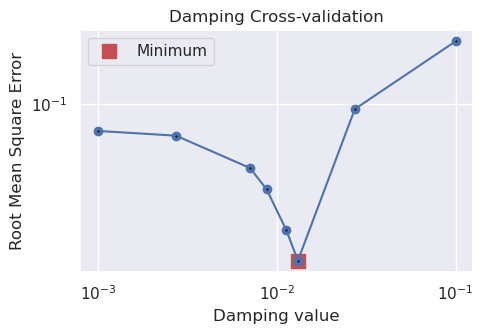

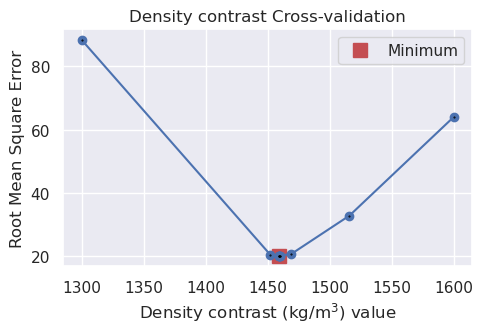

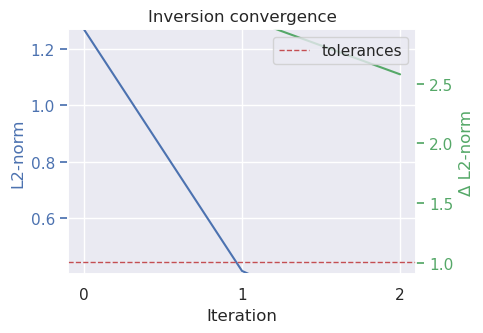

In [59]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 5: with regional

In [192]:
i = 6
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

grav_df = pd.read_csv(f"../../results/Ross_Sea_0{i}_grav_df.csv")

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [193]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-34.989678,-3.019316,-20.727439,-20.769430,0.041991,0.078451
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-35.445355,-3.099260,-19.467526,-19.457945,-0.009581,0.044737
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-35.854896,-3.136985,-18.056731,-18.039210,-0.017521,0.035284
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-36.172834,-3.123845,-16.513645,-16.536077,0.022432,0.030862
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-36.381654,-3.125114,-14.929215,-14.971335,0.042120,0.025382


In [194]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
# grav_df["true_reg"] = grav_df.gravity_anomaly - grav_df.bathymetry_grav
grav_df["true_reg"] = grav_df.basement_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,true_reg
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-34.989678,-0.561363,-20.727439,-20.769430,0.041991,0.078451,-20.166076
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-35.445355,-0.609297,-19.467526,-19.457945,-0.009581,0.044737,-18.858229
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-35.854896,-0.618253,-18.056731,-18.039210,-0.017521,0.035284,-17.438478
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-36.172834,-0.582778,-16.513645,-16.536077,0.022432,0.030862,-15.930867
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-36.381654,-0.569378,-14.929215,-14.971335,0.042120,0.025382,-14.359836


In [195]:
print(f"MAE of regional:{np.abs(grav_df.true_reg - grav_df.reg).mean()}")
print(f"Max regional error: {np.abs(grav_df.true_reg - grav_df.reg).max()}")

MAE of regional:0.6078680889788894
Max regional error: 1.8184932545749977


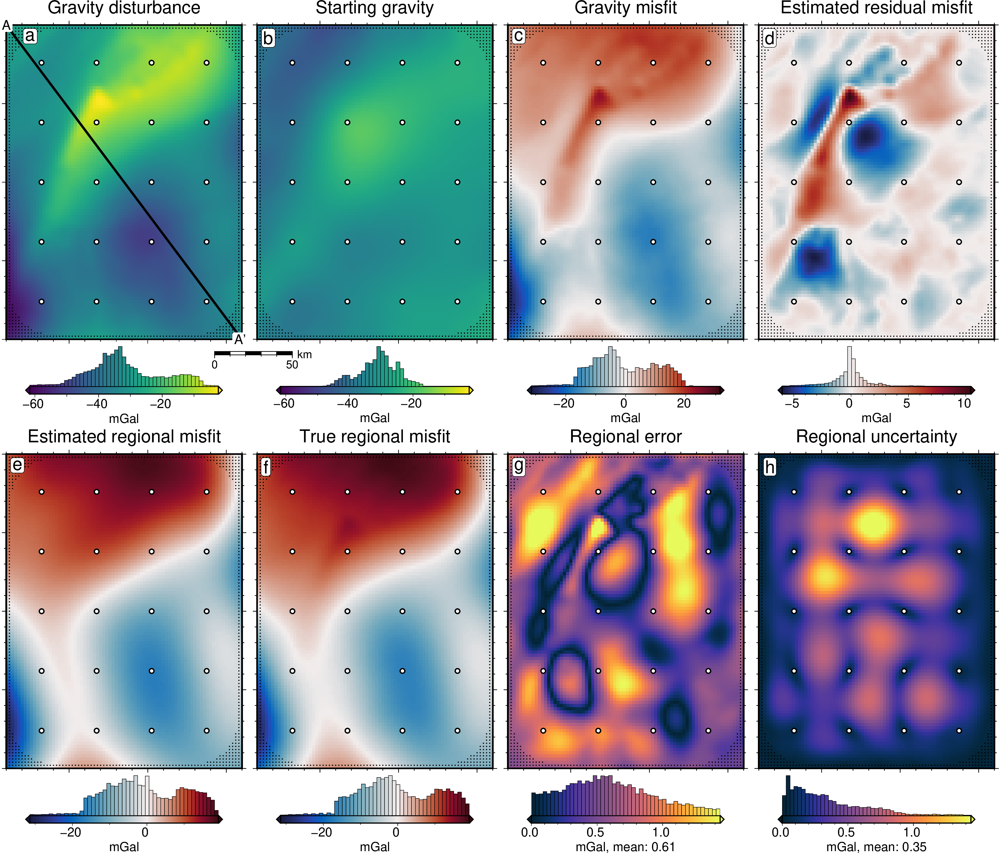

In [196]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly)

# plot the observed gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity disturbance",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    scalebar=True,
    scale_position="jBR+o-1.6c/-.6c",
    scale_length=50,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the starting gravity
fig = maps.plot_grd(
    grav_grid.starting_gravity,
    fig_height=10,
    cpt_lims=lims,
    title="Starting gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=polar_utils.get_min_max(dif, absolute=True),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    # robust=True,
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max([grav_grid.true_reg, grav_grid.reg])
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="both_shift",
    yshift_amount=-1.05,
    xshift_amount=-1.01 * 3,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)

fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    # yshift_amount=.5025,
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = np.abs(grav_grid.true_reg - grav_grid.reg)
dif_lims = (0, polar_utils.get_combined_min_max([grav_grid.reg_uncert, dif], robust=True)[1])
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="thermal",
    cpt_lims=dif_lims,
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional uncertainty
fig = maps.plot_grd(
    grav_grid.reg_uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    robust=True,
    title="Regional uncertainty",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="h",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_05_grav_anomalies.png")
fig.show()

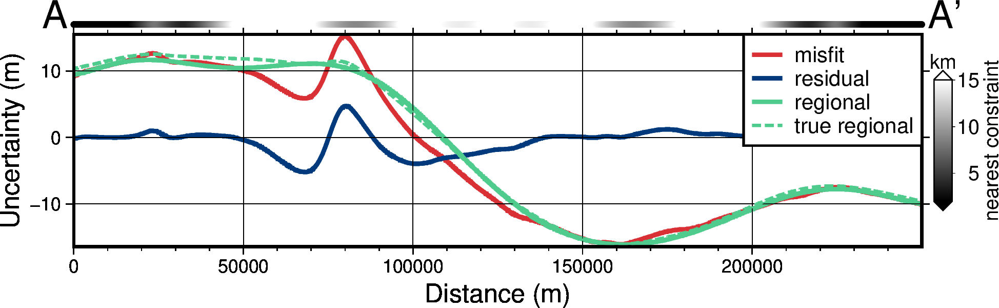

In [197]:
titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
    # "true residual",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
    # grav_grid.true_res,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "78/203/141",  # green, 4ecb8d
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jTR+o0c/0c",
    data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [2e3, 15e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig("../../paper/figures/Ross_Sea_05_grav_anomalies_profiles.png")
fig.show()

In [198]:
# grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# lims = polar_utils.get_min_max(grav_grid.basement_grav)

# # plot the noise-free gravity
# fig = maps.plot_grd(
#     grav_grid.true_reg,
#     fig_height=10,
#     cpt_lims=lims,
#     title="True regional gravity",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     hist_bin_num=50,
#     cbar_yoffset=1.5,
#     points=constraint_points,
#     points_style="x.3c",
# )
# # plot profiles location, and endpoints on map
# fig.plot(
#     vd.line_coordinates(profile_start, profile_end, size=100),
#     pen="2p,black",
# )
# fig.text(
#     x=profile_start[0],
#     y=profile_start[1],
#     text="A",
#     fill="white",
#     font="12p,Helvetica,black",
#     justify="CM",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.text(
#     x=profile_end[0],
#     y=profile_end[1],
#     text="A' ",
#     fill="white",
#     font="12p,Helvetica,black",
#     justify="CM",
#     clearance="+tO",
#     no_clip=True,
# )
# fig.text(
#     position="TL",
#     text="a",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.6/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# dif = np.abs(grav_grid.true_reg - grav_grid.reg)
# # dif_lims = polar_utils.get_min_max(dif, robust=False)
# dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
# # dif_lims = [1]
# fig = maps.plot_grd(
#     dif,
#     fig_height=10,
#     # cmap="balance+h0",
#     cmap="thermal",
#     # cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
#     cpt_lims=dif_lims,
#     # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
#     title=f"MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
#     title_font="16p,Helvetica,black",
#     cbar_label="difference (mGal)",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     hist_bin_num=50,
#     cbar_yoffset=1.5,
#     grd2_cpt=True,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.01,
#     points=constraint_points,
#     points_style="x.3c",
# )
# fig.text(
#     position="TL",
#     text="b",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the estimated regional
# fig = maps.plot_grd(
#     grav_grid.reg,
#     fig_height=10,
#     cpt_lims=lims,
#     title="Estimated regional gravity",
#     title_font="16p,Helvetica,black",
#     cbar_label="mGal",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     hist_bin_num=50,
#     cbar_yoffset=1.5,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.01,
#     points=constraint_points,
#     points_style="x.3c",
#     scalebar=True,
#     scale_position="jBL+o-.9c/-.6c",
#     scale_length=50,
# )
# fig.text(
#     position="TL",
#     text="c",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # plot the regional uncertainty
# fig = maps.plot_grd(
#     grav_grid.reg_uncert,
#     fig_height=10,
#     cpt_lims=dif_lims,
#     cmap="thermal",
#     robust=True,
#     title="Regional gravity uncertainty",
#     title_font="16p,Helvetica,black",
#     # cbar_label=f"mGal, mean: {}",
#     cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
#     cbar_font="18p,Helvetica,black",
#     frame=["nswe", "xaf10000", "yaf10000"],
#     hist=True,
#     hist_bin_num=50,
#     cbar_yoffset=1.5,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.01,
#     points=constraint_points,
#     points_style="x.3c",
# )
# fig.text(
#     position="TL",
#     text="d",
#     fill="white",
#     pen=True,
#     font="16p,Helvetica,black",
#     offset="j.2/.2",
#     clearance="+tO",
#     no_clip=True,
# )
# # fig.savefig("../../paper/figures/Ross_Sea_05_regional_error.png")
# fig.show()

In [199]:
# titles = [
#     "regional",
#     "true regional",
# ]
# grids = [
#     grav_grid.reg,
#     grav_grid.true_reg,
# ]
# data_ylims = None
# data_dict = profiles.make_data_dict(
#     names=titles,
#     grids=grids,
#     colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
#         "216/48/52",  # red, d83034
#         "0/58/125",  # dark blue, 003a7d
#         "78/203/141",  # green, 4ecb8d
#         "199/1/255",  # purple, c701ff
#         "255/157/58",  # orange, ff9d3a
#         "0/141/255",  # med blue, 008dff
#         "255/115/182",  # pink, ff73b6
#         "249/232/88",  # yellow, f9e858
#     ],
# )

# fig, df_data = profiles.plot_data(
#     "points",
#     start=profile_start,
#     stop=profile_end,
#     num=10000,
#     fig_height=4,
#     fig_width=14,
#     data_dict=data_dict,
#     data_legend_loc="jBL+o0c/0c",
#     data_legend_box="+gwhite+p1p",
#     data_buffer=0.01,
#     data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
#     # data_pen_style=[None,None,"4_2:2p"],
#     data_pen_thickness=[2, 1.8, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5],
#     share_yaxis=True,
#     start_label="A",
#     end_label="A' ",
# )

# # get grid of min dists to nearest constraints
# min_dist = utils.normalized_mindist(
#     constraint_points,
#     grids[0],
# )

# # set y height in data units for add dist to constraint points
# data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

# if data_ylims is not None:
#     data_max = data_ylims[1]

# df_data = profiles.sample_grids(
#     df_data, min_dist, interpolation="b", sampled_name="min_dist"
# )
# # set color limits
# series = [2e3, 15e3]

# pygmt.makecpt(
#     cmap="gray",
#     series=series,
#     background=True,
# )
# fig.shift_origin(
#     yshift=".2c",
# )
# fig.plot(
#     x=df_data.dist,
#     y=np.ones_like(df_data.dist) * data_max,
#     style="c0.1c",
#     fill=df_data.min_dist,
#     cmap=True,
#     no_clip=True,
# )
# fig.shift_origin(
#     yshift="-.2c",
# )
# with pygmt.config(
#     FONT="26p,Helvetica,black",
# ):
#     fig.colorbar(
#         cmap=True,
#         position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
#         frame=["xa+lnearest constraint", "y+lkm"],
#         scale=0.001,
#     )
# # fig.savefig("../../paper/figures/Ross_Sea_05_regional_profiles.png")
# fig.show()

In [200]:
np.abs(dif).mean(), np.abs(dif).max()

(<xarray.DataArray ()> Size: 8B
 array(0.60786809),
 <xarray.DataArray ()> Size: 8B
 array(1.81849325))

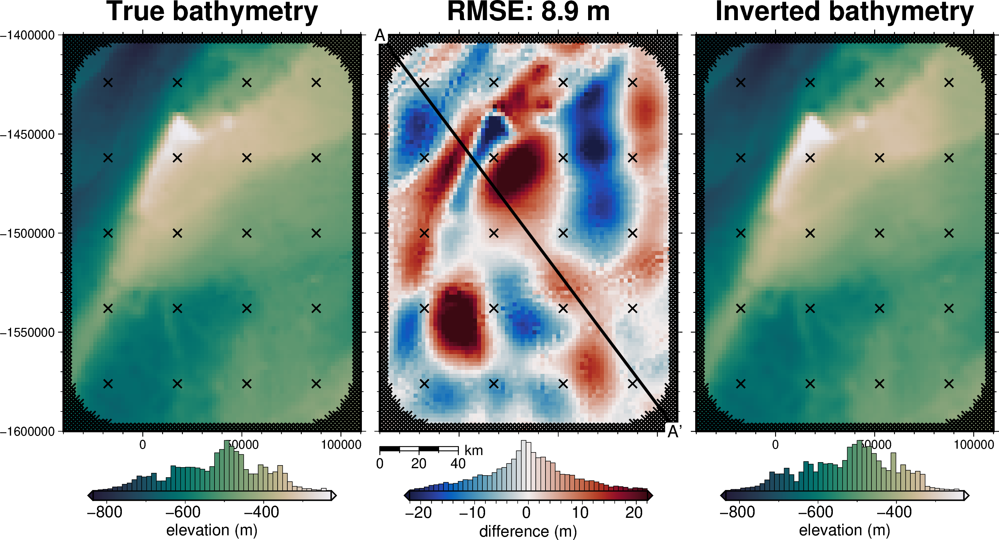

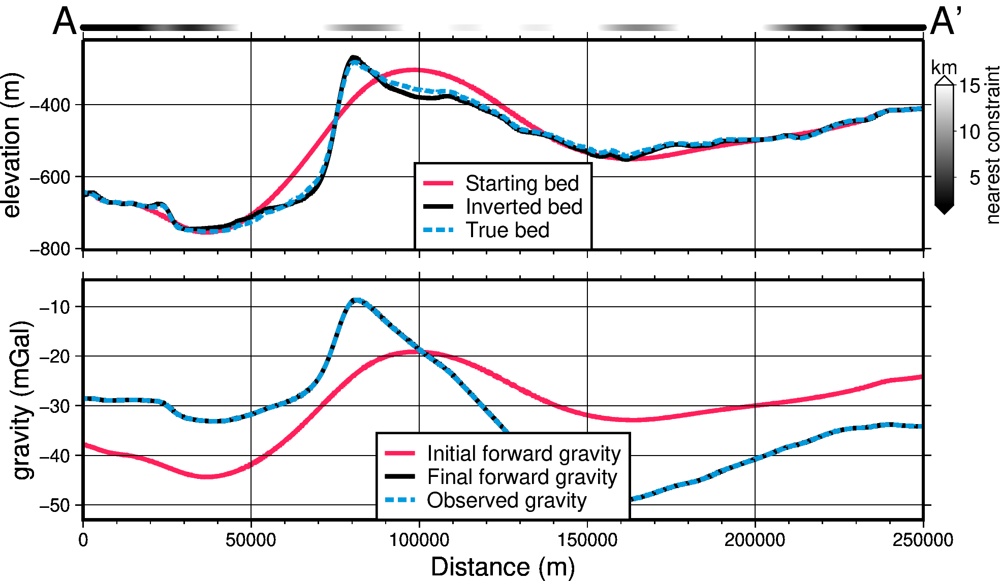

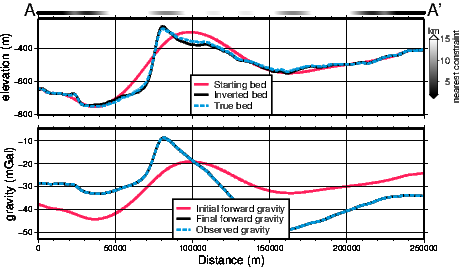

In [201]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [202]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(31.97353342548336)

In [203]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(20.08546547)

In [204]:
np.abs(
    bathymetry
    - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(6.5948331)

In [205]:
np.abs(
    bathymetry
    - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(6.27236439)

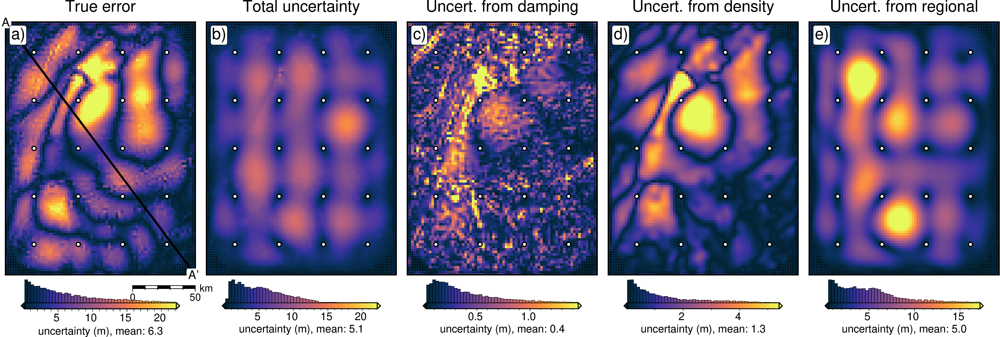

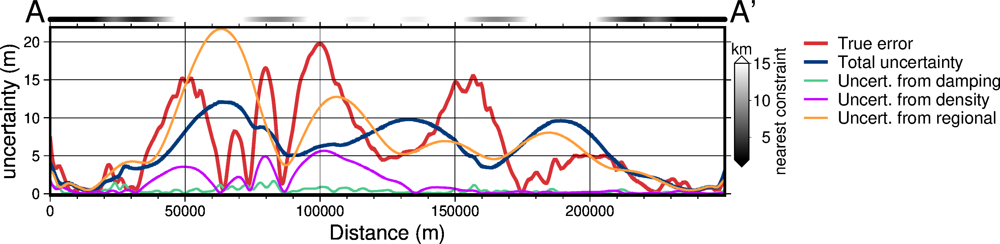

In [206]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_05_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    # data_ylims=[0, 20],
    # data_legend_loc="jTC+o3c/0c",
    fname="../../paper/figures/Ross_Sea_05_sensitivity_profiles.png",
)

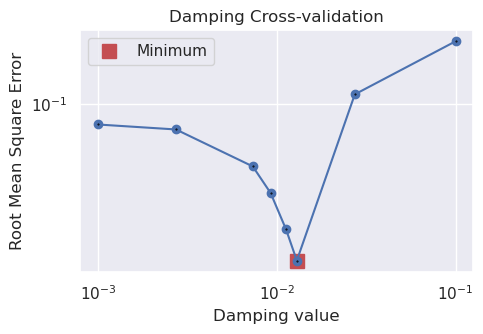

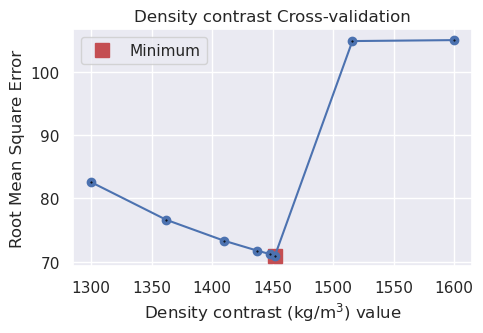

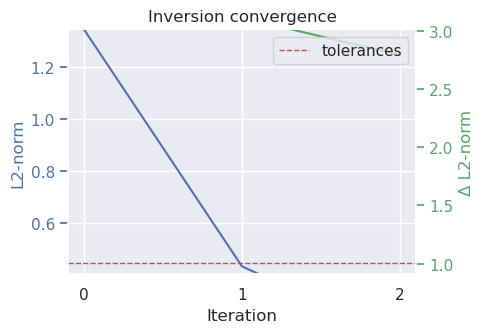

In [207]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 6: Realistic scenario

In [208]:
i = 7
final_bathymetry = final_bathymetries[i - 2]
inversion_results = optimal_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

grav_df = pd.read_csv(f"../../results/Ross_Sea_0{i}_grav_df.csv")
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [209]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert_constant,eqs_gravity_anomaly,...,misfit,reg,res,predicted_grav,reg_uncert,reg_stochastic,eqs_uncert,gravity_anomaly_eqs_mean,gravity_anomaly,uncert
0,-1600000.0,-40000.0,1000.0,-35.551041,-0.576200,-20.166076,-55.717117,-56.108610,0.5,-51.642166,...,-16.201840,-16.791358,0.589518,-51.423032,0.437355,-17.282141,1.517498,-51.192039,-51.192039,1.517498
1,-1600000.0,-38000.0,1000.0,-36.054652,-0.523887,-18.858229,-54.912881,-55.483439,0.5,-51.808887,...,-15.970129,-16.246059,0.275930,-51.225398,0.250722,-16.555248,1.202784,-51.416691,-51.416691,1.202784
2,-1600000.0,-36000.0,1000.0,-36.473148,-0.467097,-17.438478,-53.911626,-54.600484,0.5,-51.379621,...,-15.213048,-15.451837,0.238789,-50.631327,0.149903,-15.626705,1.044704,-51.069912,-51.069912,1.044704
3,-1600000.0,-34000.0,1000.0,-36.755612,-0.406792,-15.930867,-52.686479,-53.347323,0.5,-50.574836,...,-14.188636,-14.463442,0.274806,-49.940419,0.115322,-14.542383,0.965152,-50.364319,-50.364319,0.965152
4,-1600000.0,-32000.0,1000.0,-36.951032,-0.343951,-14.359836,-51.310869,-51.806348,0.5,-49.577791,...,-13.054614,-13.329687,0.275072,-49.120645,0.109523,-13.343302,0.883932,-49.440144,-49.440144,0.883932


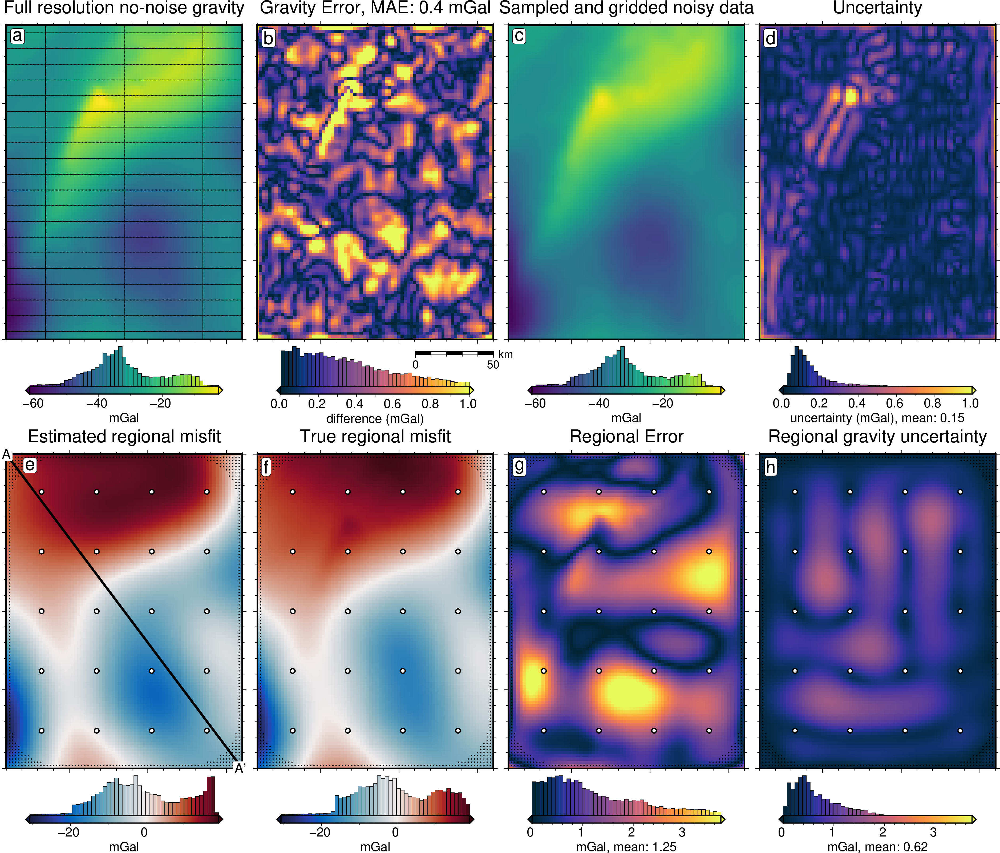

In [210]:
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

# plot the noise-free full res gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution no-noise gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the gravity error
dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
dif = np.abs(dif)
# dif_lims = polar_utils.get_min_max(dif, robust=True)
# dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
dif_lims = (0, 1)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    # cmap="balance+h0",
    cmap="thermal",
    cpt_lims=dif_lims,
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"Gravity Error, MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBR+o0c/-.6c",
    scale_length=50,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisy interpolated gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded noisy data",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    cmap="thermal",
    # robust=True,
    cpt_lims=dif_lims,
    title="Uncertainty",
    title_font="16p,Helvetica,black",
    # cbar_label=f"mGal, mean: {}",
    cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the estimated regional
# grav_grid["true_reg"] = (
#     grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.bathymetry_grav
# )
grav_grid["true_reg"] = grav_grid.basement_grav

reg_lims = polar_utils.get_combined_min_max([grav_grid.true_reg, grav_grid.reg])
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="both_shift",
    xshift_amount=-3 * 1.01,
    yshift_amount=-1.05,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="balance+h0",
    # robust=True,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the regional error
dif = np.abs(grav_grid.true_reg - grav_grid.reg)
dif_lims = (0, polar_utils.get_combined_min_max([grav_grid.reg_uncert, dif], robust=True)[1])
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="thermal",
    cpt_lims=dif_lims,
    title="Regional Error",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the regional uncertainty
fig = maps.plot_grd(
    grav_grid.reg_uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    robust=True,
    title="Regional gravity uncertainty",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points[~constraint_points.inside],
    points_style="p1p",
)
fig.plot(
    x=constraint_points[constraint_points.inside].easting,
    y=constraint_points[constraint_points.inside].northing,
    style="c.15c",
    fill="white",
    pen="1p,black",
)
fig.text(
    position="TL",
    text="h",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.savefig("../../paper/figures/Ross_Sea_06_grav_anomalies.png")
fig.show()

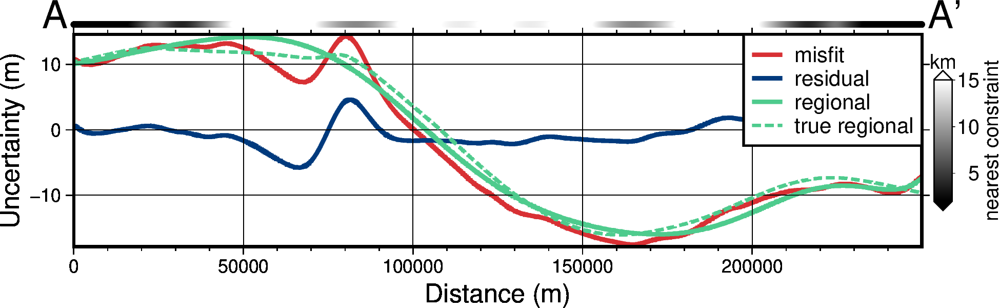

In [211]:
titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "78/203/141",  # green, 4ecb8d
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jTR+o0c/0c",
    data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+lUncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [2e3, 15e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig("../../paper/figures/Ross_Sea_06_grav_anomalies_profiles.png")
fig.show()

In [212]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
grav_error.describe()

count    7676.000000
mean        0.400325
std         0.357458
min         0.000034
25%         0.147515
50%         0.315483
75%         0.553399
max         4.525078
dtype: float64

In [213]:
reg_error = np.abs(grav_df.basement_grav - grav_df.reg)
reg_error.describe()

count    7676.000000
mean        1.252769
std         0.979076
min         0.000357
25%         0.488898
50%         0.976676
75%         1.852491
max         4.476539
dtype: float64

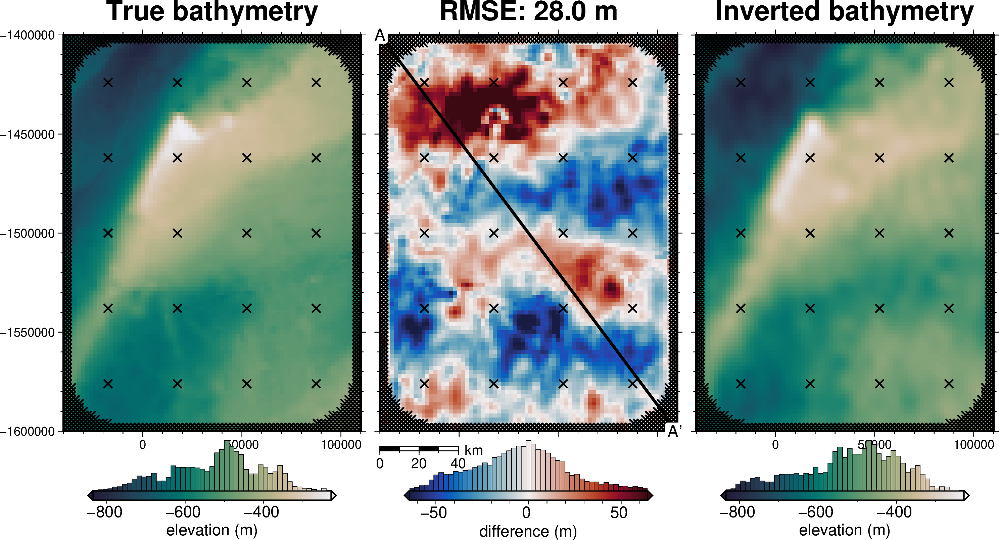

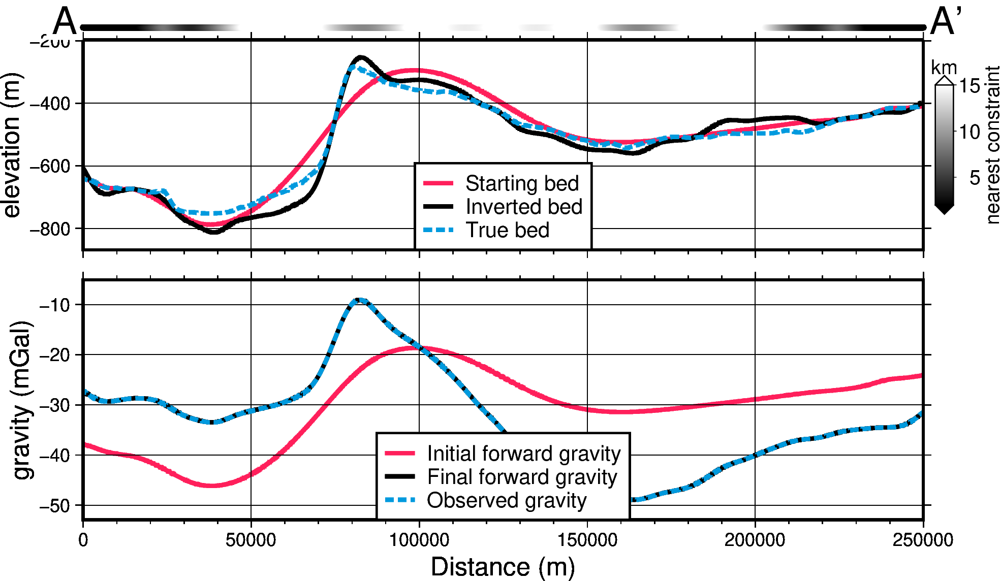

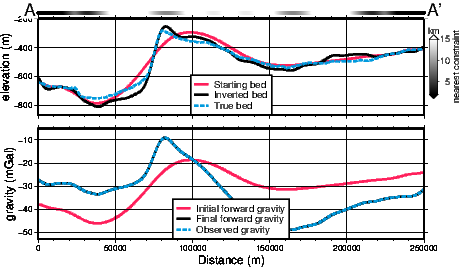

In [214]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [215]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(34.91500052777304)

In [216]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(23.09434071)

In [237]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).max()

<xarray.DataArray ()> Size: 8B
array(255.60255321)

In [238]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().topo
).max()

<xarray.DataArray ()> Size: 8B
array(109.84737684)

In [219]:
np.abs(
    bathymetry
    - final_bathymetry
).mean()

<xarray.DataArray ()> Size: 8B
array(21.46567205)

In [220]:
np.abs(
    bathymetry
    - stochastic_mean
).mean()

<xarray.DataArray ()> Size: 8B
array(21.0045203)

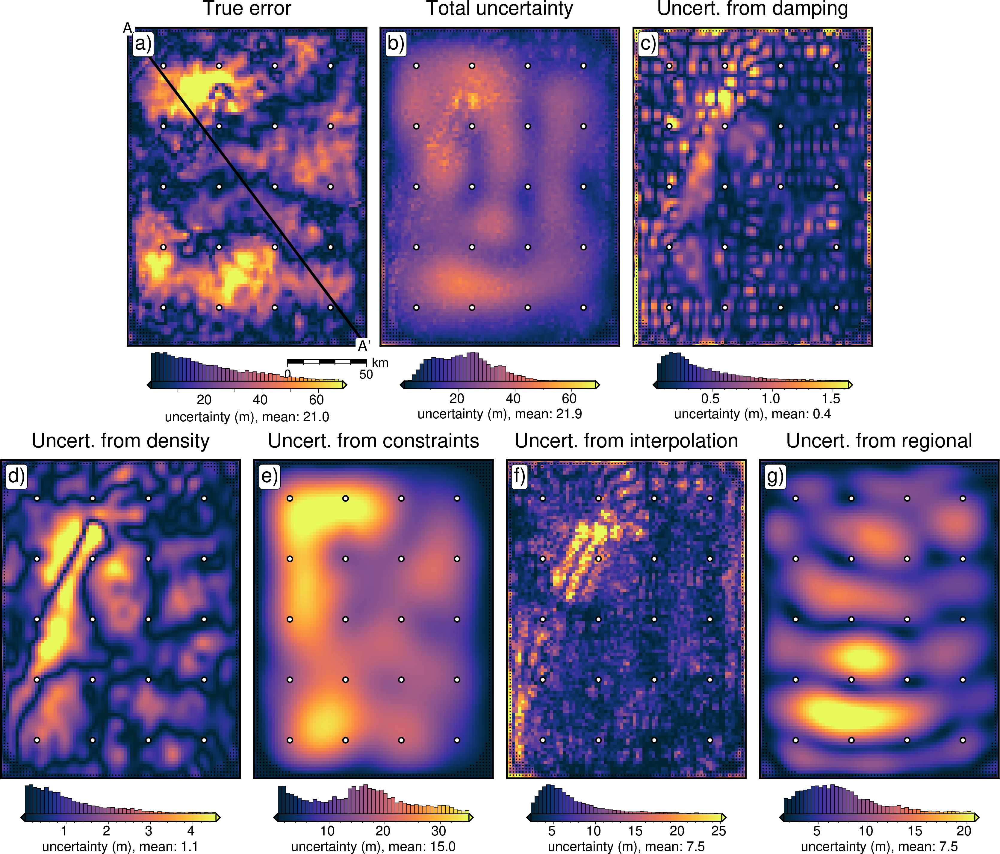

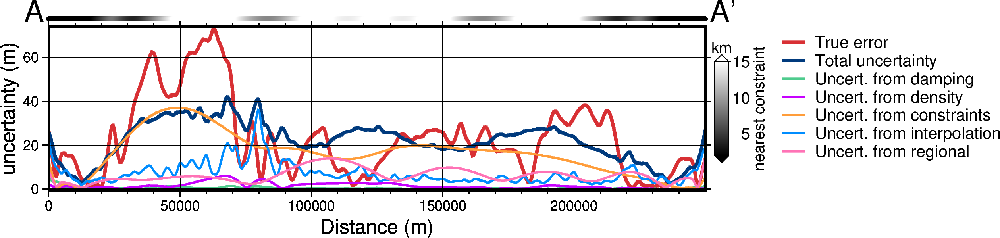

In [221]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from constraints",
    # "Uncert. from gravity",
    "Uncert. from interpolation",
    "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))
grids = [
    # np.abs(final_bathymetry - bathymetry),
    np.abs(stochastic_mean - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.constraints_stdev,
    # sensitivity_ds.grav_stdev,
    sensitivity_ds.eq_sources_stdev,
    sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=3,
    fname="../../paper/figures/Ross_Sea_06_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    # data_ylims=[0, 00],
    fname="../../paper/figures/Ross_Sea_06_sensitivity_profiles.png",
)

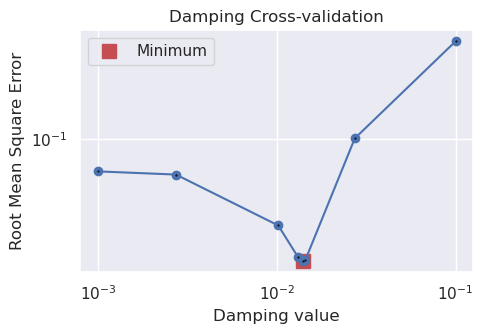

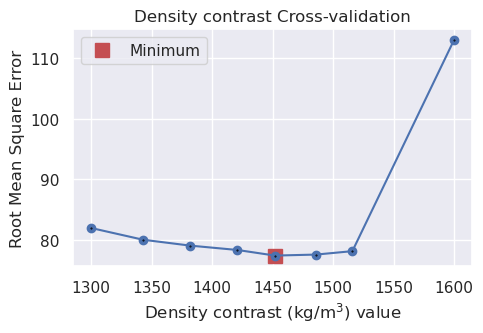

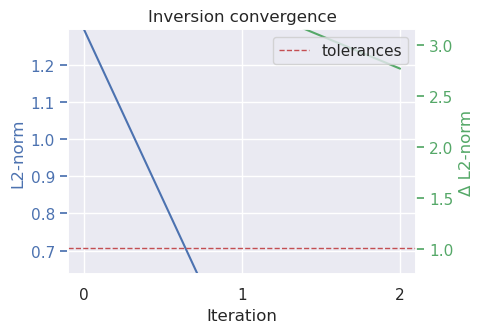

In [222]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# All together
## Damping CV's

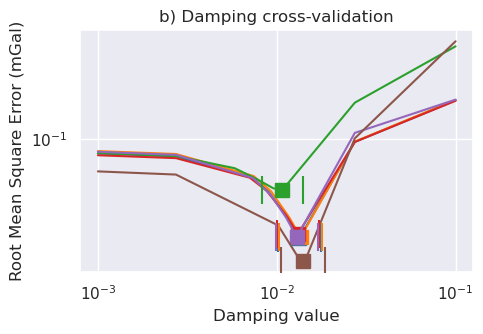

In [223]:
fig, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    # , # test 0
    0.11940749533486737,  # test 1
    0.11994569373032848,  # test 2
    0.1150566110223811,  # test 3
    0.11892575358645757,  # test 4
    0.1190086411178740149,  # test 5
    0.12499540588487122,  # test 6
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_damping.values
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=inversion_titles[i],
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax.set_xscale("log")
ax.set_yscale("log")

# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# ax.legend(loc='upper right', fontsize=8)
ax.set_xlabel("Damping value")
ax.set_ylabel("Root Mean Square Error (mGal)")
ax.set_title("b) Damping cross-validation")

plt.tight_layout()
# plt.legend(fontsize=10)

plt.savefig("../../paper/figures/Ross_Sea_damping_cvs.png")

## Density optimizations

In [224]:
density_studies

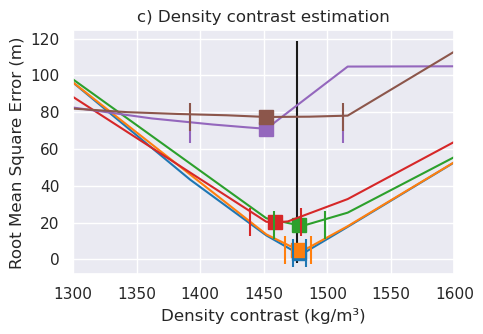

In [225]:
fig, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    # , # test 0
    5,  # test 1
    10,  # test 2
    20,  # test 3
    20,  # test 4
    60,  # test 5
    60,  # test 6
]
for i, j in enumerate(density_studies):
    # if i == 0:
    #     pass
    # else:
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_density_contrast.values
    param_name = "Density"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        zorder=2,
        # xerr=stdevs[i],
        # capsize=10,
        # linestyle=None,
        # elinewidth=0,
        # # ecolor='k',
        # capthick=1.5,
    )

    # plot +/- stdev's
    upper = df.parameters.iloc[best] + stdevs[i]
    lower = df.parameters.iloc[best] - stdevs[i]

    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

    # # plot K-Folds approach for Tests 5 and 6
    # if i in [4, 5]:
    #     f = f"../../results/Ross_Sea_0{i+2}_density_cv_study.pickle"
    #     with pathlib.Path(f).open("rb") as f:
    #         j =  pickle.load(f)

    #     scores = j.trials_dataframe().value.values
    #     parameters = j.trials_dataframe().params_density_contrast.values
    #     param_name = "Density"

    #     df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    #     df = df0.sort_values(by="parameters")

    #     best = df.scores.argmin()

    #     color = sns.color_palette("tab10")[i]

    #     ax.plot(
    #         df.parameters,
    #         df.scores,
    #         color=color,
    #         linestyle="dotted",
    #     )

    #     # plot square for best value
    #     ax.plot(
    #         df.parameters.iloc[best],
    #         df.scores.iloc[best],
    #         "s",
    #         markersize=6,
    #         color=color,
    #         zorder=2,
    #     )

y_lims = ax.get_ylim()
ax.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_xlabel("Density contrast (kg/m³)")
ax.set_ylabel("Root Mean Square Error (m)")
ax.set_title("c) Density contrast estimation")

ax.set_xlim(1300, 1600)

plt.tight_layout()

plt.savefig("../../paper/figures/Ross_Sea_density_optimizations.png")

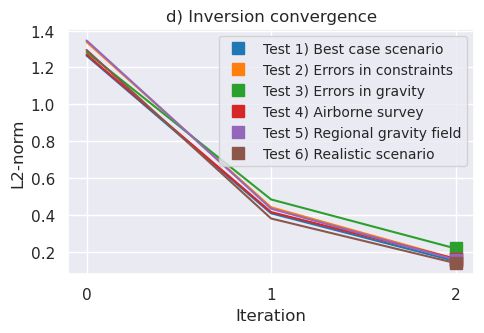

In [226]:
fig, ax1 = plt.subplots(figsize=(5, 3.5))

for i, j in enumerate(optimal_results):
    grav_results = j[1]
    params = j[2]

    # get misfit data at end of each iteration
    cols = [s for s in grav_results.columns.to_list() if "_final_misfit" in s]
    iters = len(cols)

    l2_norms = [np.sqrt(utils.rmse(grav_results[i])) for i in cols]
    starting_misfit = utils.rmse(grav_results["iter_1_initial_misfit"])
    starting_l2_norm = np.sqrt(starting_misfit)

    # add starting l2 norm to the beginning of the list
    l2_norms.insert(0, starting_l2_norm)

    # calculate delta L2-norms
    delta_l2_norms = []
    for k, m in enumerate(l2_norms):
        if k == 0:
            delta_l2_norms.append(np.nan)
        else:
            delta_l2_norms.append(l2_norms[k - 1] / m)

    # get tolerance values
    l2_norm_tolerance = float(params["L2 norm tolerance"])
    delta_l2_norm_tolerance = float(params["Delta L2 norm tolerance"])

    color = sns.color_palette("tab10")[i]

    # plot L2-norm convergence
    ax1.plot(
        range(iters + 1),
        l2_norms,
        color=color,
        # label=inversion_titles[i],
    )
    # plot square for end iteration
    ax1.plot(
        iters,
        l2_norms[-1],
        "s",
        markersize=8,
        color=color,
        zorder=2,
        label=f"Test {i+1}) {inversion_titles[i]}",
    )
# set x axis to integer values
ax1.xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))

ax1.legend(loc="upper right", fontsize=10)

# set axis labels, ticks and gridlines
ax1.set_xlabel("Iteration")
ax1.set_ylabel("L2-norm")
ax1.tick_params(axis="y", which="both")
plt.title("d) Inversion convergence")
plt.tight_layout()
plt.savefig("../../paper/figures/Ross_Sea_convergences.png")
plt.show()

## Inversion results

In [227]:
dif_grids = []
for g in final_bathymetries:
# for g in final_stochastic_means:
    dif_grids.append(bathymetry - g)

# use combined min max
# dif_lims = polar_utils.get_combined_min_max(dif_grids, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
dif_lims = polar_utils.get_min_max(dif_grids[-2], robust=True)

dif_lims

(np.float64(-18.11305254794314), np.float64(22.07284940799758))

In [228]:
# stochastic_dif_grids = []
# for g in final_stochastic_means:
#     stochastic_dif_grids.append(bathymetry - g)

# # use combined min max
# # dif_lims = polar_utils.get_combined_min_max(dif_grids, robust=True)

# # use quartiles for combined min/max
# # mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# # maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# # dif_lims = mins.quantile(.25), maxes.quantile(.75)

# # set min max as 2nd to last grid
# stochastic_dif_lims = polar_utils.get_min_max(stochastic_dif_grids[-2], robust=True)

# stochastic_dif_lims

In [229]:
abs_inversion_errors = []
uncert_errors = []
# for i, g in enumerate(final_stochastic_means):
for i, g in enumerate(final_bathymetries):
    abs_inversion_error = np.abs(bathymetry - g)
    abs_inversion_errors.append(abs_inversion_error)

    uncert_errors.append(abs_inversion_error - final_uncertainties[i])

# use combined min max
inversion_error_lims = (
    0,
    polar_utils.get_combined_min_max(abs_inversion_errors, robust=True)[1],
)
# uncert_error_lims = polar_utils.get_combined_min_max(uncert_errors, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
uncert_error_lims = polar_utils.get_min_max(uncert_errors[-2], robust=True)

inversion_error_lims, uncert_error_lims

((0, np.float64(66.94666520378536)),
 (np.float64(-8.700935382000338), np.float64(15.20051400470798)))

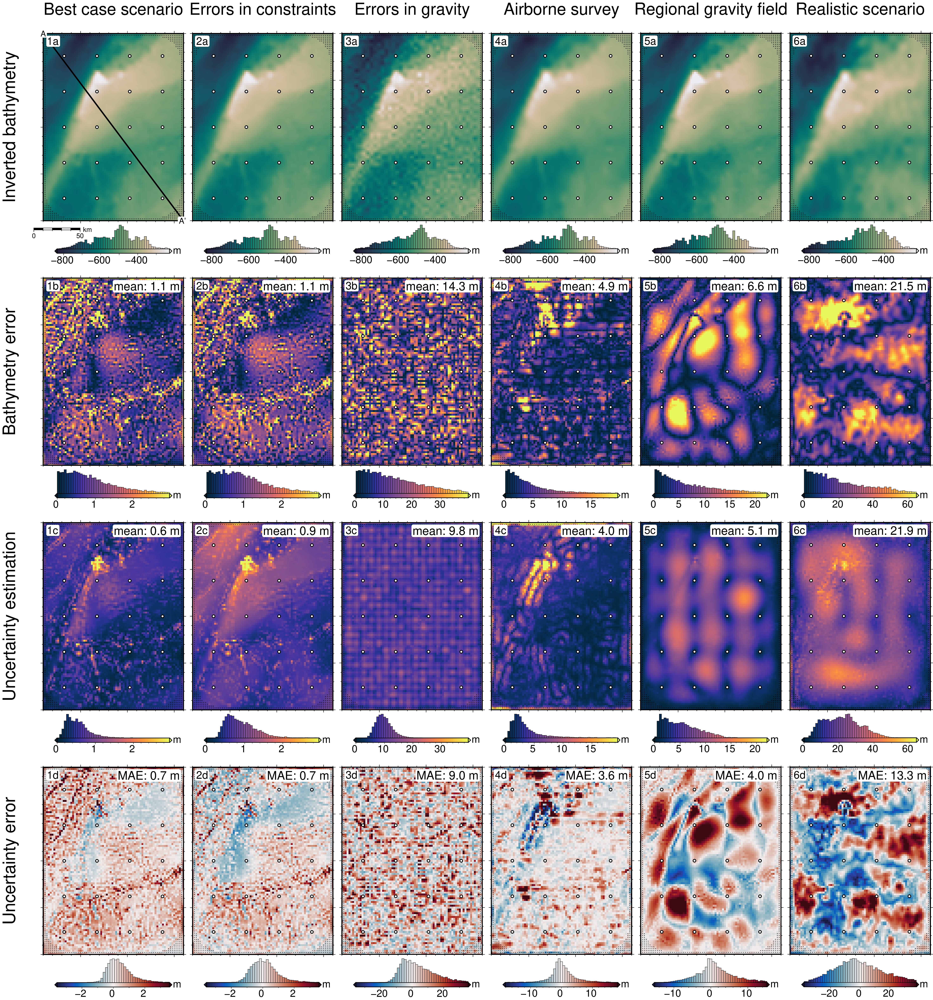

In [230]:
bathy_lims = polar_utils.get_min_max(bathymetry)

inversion_MAEs = []
inversion_RMSEs = []
uncert_MAEs = []
uncert_RMSEs = []
uncert_MAs = []
for i, g in enumerate(final_bathymetries):
# for i, g in enumerate(final_stochastic_means):
    if i == 0:
        fig = None
        origin_shift = "initialize"
        scalebar = True
    else:
        origin_shift = "both_shift"
        scalebar = False

    constraint_points = constraint_points_dfs[i]

    yshift_amount = 1.005
    # plot the inverted bathymetry
    fig = maps.plot_grd(
        g,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=bathy_lims,
        # cbar_label="elevation (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift=origin_shift,
        yshift_amount=3 * yshift_amount,
        xshift_amount=1.01,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
        scalebar=scalebar,
        scale_position="jBL+o-.5c/-.6c",
        scale_length=50,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    # add title to each column
    fig.text(
        y=plot_region[3] + 20e3,
        x=np.mean([plot_region[0], plot_region[1]]),
        justify="BC",
        text=inversion_titles[i],
        fill="white",
        font="25p,Helvetica,black",
        clearance="+tO",
        no_clip=True,
    )

    if i == 0:
        # add title to top row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Inverted bathymetry",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )
        # # add subplot label
        # fig.text(
        #     position="TL",
        #     justify="BR",
        #     offset="j1c/1c",
        #     text = "a)",
        #     fill = 'white',
        #     font = '36p,Helvetica,black',
        #     clearance = '+tO',
        #     no_clip=True,
        # )
        # add transect line
        # plot profiles location, and endpoints on map
        fig.plot(
            vd.line_coordinates(profile_start, profile_end, size=100),
            pen="2p,black",
        )
        fig.text(
            x=profile_start[0],
            y=profile_start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=profile_end[0],
            y=profile_end[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )

    # plot subplot labels (1a, 1b, 1c, etc.)
    fig.text(
        position="TL",
        text=f"{i+1}a",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # cpt_lims = polar_utils.get_min_max(dif_grids[i], robust=True)
    cpt_lims = polar_utils.get_combined_min_max([dif_grids[i], final_uncertainties[i]], robust=True)

    # combine cmaps for 1 and 2
    if (i==0) | (i==1):
        bathy_error_lims = (0, polar_utils.get_combined_min_max(dif_grids[0:2], robust=True)[1])
    # # combine cmaps for 3 and 4
    # elif (i==2) | (i==3):
    #     bathy_error_lims = (0, polar_utils.get_combined_min_max(dif_grids[2:4], robust=True)[1])
    else:
        bathy_error_lims = (0, vd.maxabs(cpt_lims))

    # plot bathymetry error
    fig = maps.plot_grd(
        np.abs(dif_grids[i]),
        fig_height=10,
        cmap="thermal",
        cpt_lims=bathy_error_lims,
        # cpt_lims=(0, np.abs(polar_utils.get_combined_min_max(dif_grids, robust=True)[1])),
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    inversion_MAE = np.abs(dif_grids[i]).values.mean()
    inversion_RMSE = utils.rmse(dif_grids[i])
    # stochastic_inversion_MAE = np.abs(stochastic_dif_grids[i]).values.mean()
    # add to lists
    inversion_MAEs.append(inversion_MAE)
    inversion_RMSEs.append(inversion_RMSE)

    # add errors to plot
    fig.text(
        position="TR",
        # text=f"RMSE: {round(inversion_RMSE,1)} m",
        text=f"mean: {round(inversion_MAE,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}b",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 2nd row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Bathymetry error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # combine cmaps for 1 and 2
    if (i==0) | (i==1):
        uncert_lims = (0, polar_utils.get_combined_min_max(dif_grids[0:2], robust=True)[1])
    else:
        uncert_lims = (0, vd.maxabs(cpt_lims))

    # plot the uncertainty
    fig = maps.plot_grd(
        final_uncertainties[i],
        fig_height=10,
        cmap="thermal",
        # robust=True,
        cpt_lims=uncert_lims,
        # cbar_label="elevation (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    uncert_MA = np.abs(final_uncertainties[i].values).mean()
    uncert_RMS = utils.rmse(final_uncertainties[i])
    uncert_MAs.append(uncert_MA)

    # add mean / rms to plot
    fig.text(
        position="TR",
        # text=f"RMS: {round(uncert_RMS,1)} m",
        text=f"mean: {round(uncert_MA,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}c",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 3rd row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Uncertainty estimation",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # combine cmaps for 1 and 2
    cpt_lims = polar_utils.get_min_max(uncert_errors[i], robust=True)
    if (i==0) | (i==1):
        lims = polar_utils.get_combined_min_max(uncert_errors[0:2], robust=True)
        uncert_error_lims = (-vd.maxabs(lims), vd.maxabs(lims))
    else:
        uncert_error_lims = (-vd.maxabs(cpt_lims), vd.maxabs(cpt_lims))

    # plot uncertainty error
    fig = maps.plot_grd(
        uncert_errors[i],
        fig_height=10,
        cmap="balance+h0",
        cpt_lims=uncert_error_lims,
        # title_font="18p,Helvetica,black",
        # cbar_label=f"difference (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        # scalebar=True,
        # scale_position="jBL+o0c/-.6c",
        points=constraint_points[~constraint_points.inside],
        points_style="p1p",
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="c.15c",
        fill="white",
        pen="1p,black",
    )

    uncert_MAE = np.abs(uncert_errors[i]).values.mean()
    uncert_RMSE = utils.rmse(uncert_errors[i])
    uncert_MAEs.append(uncert_MAE)
    uncert_RMSEs.append(uncert_RMSE)

    # add RMSE / MAE to plot
    fig.text(
        position="TR",
        # text=f"RMS: {round(uncert_RMSE,1)} m",
        text=f"MAE: {round(uncert_MAE,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}d",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 4th row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Uncertainty error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

fig.savefig("../../paper/figures/Ross_Sea_inversions.png", dpi=500)

fig.show()

## Sensitivity results

In [231]:
# plots_in_row = []
# for column, final_bathymetry in enumerate(final_bathymetries):
#     # get data for each test
#     sensitivity_ds = sensitivity_results[column]
#     # if column == 0:
#     #     titles = [
#     #         "True error",
#     #         "Total uncertainty",
#     #     ]
#     #     grids=[
#     #         np.abs(final_bathymetry - bathymetry),
#     #         final_uncertainties[column],
#     #     ]
#     #     constraint_points = constraint_points_dfs[column]
#     #     plots_in_row.append(len(grids))
#     if column == 0:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 1:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 2:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from gravity",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.gravity_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 3:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from interpolation",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds["equivalent source gridding_stdev"],
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 4:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 5:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#             "Uncert. from gravity",
#             "Uncert. from interpolation",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#             sensitivity_ds.grav_stdev,
#             sensitivity_ds["eq_sources_stdev"],
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))

#     # clip each grid to region of interest
#     grids = [g.sel(
#             easting=slice(plot_region[0], plot_region[1]),
#             northing=slice(plot_region[2], plot_region[3]),
#         ) for g in grids]

#     first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
#     # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

#     # plot specs
#     yshift_amount = -1.005
#     xshift_amount = 1
#     fig_height = 8

#     first_column = True
#     for row, g in enumerate(grids):
#         if row == 0:
#             origin_shift = "both_shift"
#             yshift_amount = -(plots_in_row[column-1]-1)*yshift_amount
#             scalebar=True
#             if column == 0:
#                 origin_shift="initialize"
#                 fig=None
#                 scalebar=True
#         else:
#             origin_shift = "yshift"
#             scalebar=False
#             yshift_amount = -1.005
#         if row < 2:
#             cpt_lims = first_2_lims
#         else:
#             cpt_lims = polar_utils.get_min_max(g, robust=True)

#         fig = maps.plot_grd(
#             grid=g,
#             fig_height=fig_height,
#             # title=titles[row],
#             # title_font="16p,Helvetica,black",
#             cmap="thermal",
#             cpt_lims = cpt_lims,
#             cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
#             cbar_font="18p,Helvetica,black",
#             hist=True,
#             hist_bin_num=50,
#             cbar_yoffset=1,
#             fig=fig,
#             origin_shift=origin_shift,
#             xshift_amount=xshift_amount,
#             yshift_amount=yshift_amount,
#             scalebar=scalebar,
#             scale_length=50,
#             scale_position="jBR+o0c/-.6c",
#         )
#         if constraint_points is not None:
#             fig.plot(
#                 x=constraint_points.easting,
#                 y=constraint_points.northing,
#                 style="x.2c",
#                 fill="white",
#                 pen="1.5p,white",
#             )
#         fig.text(
#             position="TL",
#             text=f"{string.ascii_lowercase[row]}",
#             fill="white",
#             pen=True,
#             font="16p,Helvetica,black",
#             offset="j.6/.2",
#             clearance="+tO",
#             no_clip=True,
#         )
#         if row == 0:
#             if column == 0:
#                 # plot profiles location, and endpoints on map
#                 fig.plot(
#                     vd.line_coordinates(profile_start, profile_end, size=100),
#                     pen="2p,black",
#                 )
#                 fig.text(
#                     x=profile_start[0],
#                     y=profile_start[1],
#                     text="A",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#                 fig.text(
#                     x=profile_end[0],
#                     y=profile_end[1],
#                     text="A' ",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#             # add title to each column
#             fig.text(
#                 y = plot_region[3]+40e3,
#                 x = np.mean([plot_region[0],plot_region[1]]),
#                 justify="TC",
#                 text = inversion_titles[column],
#                 fill = 'white',
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         if first_column is True:
#             # add title to each row
#             fig.text(
#                 x = plot_region[0]-30e3,
#                 y = np.mean([plot_region[2],plot_region[3]]),
#                 justify="BC",
#                 text = titles[row],
#                 fill = 'white',
#                 angle = 90,
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         first_column=False
#     # if fname is not None:
#         # fig.savefig(fname)
# fig.show()

In [232]:
# plots_in_row = []
# for i, final_bathymetry in enumerate(final_bathymetries):

#     # get data for each test
#     sensitivity_ds = sensitivity_results[i]

#     if i == 0:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 1:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 2:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             # "Uncert. from gravity",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             # sensitivity_ds.gravity_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 3:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from interpolation",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds["equivalent source gridding_stdev"],
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 4:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))
#     elif i == 5:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#             # "Uncert. from gravity",
#             "Uncert. from interpolation",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#             # sensitivity_ds.grav_stdev,
#             sensitivity_ds["eq_sources_stdev"],
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[i]
#         plots_in_row.append(len(grids))

#     # clip each grid to region of interest
#     grids = [
#         g.sel(
#             easting=slice(plot_region[0], plot_region[1]),
#             northing=slice(plot_region[2], plot_region[3]),
#         )
#         for g in grids
#     ]

#     first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
#     # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

#     # plot specs
#     # origin_shift = "both_shift"
#     # scalebar=False
#     yshift_amount = -1.005
#     xshift_amount = 1
#     fig_height = 7

#     for x, g in enumerate(grids):
#         if x == 0:
#             origin_shift = "both_shift"
#             # try:
#             xshift_amount = -(plots_in_row[i-1] - 1) * xshift_amount
#             # except:
#             #     pass
#             scalebar = True
#             if i == 0:
#                 origin_shift = "initialize"
#                 fig = None
#         else:
#             origin_shift = "xshift"
#             scalebar = False
#             xshift_amount = 1
#         if x < 2:  # noqa: SIM108
#             cpt_lims = first_2_lims
#         else:
#             cpt_lims = polar_utils.get_min_max(g, robust=True)

#         fig = maps.plot_grd(
#             grid=g,
#             fig_height=fig_height,
#             # title=titles[x],
#             # title_font="16p,Helvetica,black",
#             cmap="thermal",
#             cpt_lims=cpt_lims,
#             cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
#             cbar_font="18p,Helvetica,black",
#             hist=True,
#             hist_bin_num=50,
#             cbar_yoffset=1,
#             fig=fig,
#             origin_shift=origin_shift,
#             xshift_amount=xshift_amount,
#             yshift_amount=yshift_amount,
#             scalebar=scalebar,
#             scale_length=50,
#             scale_position="jBR+o0c/-.6c",
#         )
#         if constraint_points is not None:
#             fig.plot(
#                 x=constraint_points.easting,
#                 y=constraint_points.northing,
#                 style="x.2c",
#                 fill="white",
#                 pen="1.5p,white",
#             )
#         fig.text(
#             position="TL",
#             text=f"{string.ascii_lowercase[x]}",
#             fill="white",
#             pen=True,
#             font="16p,Helvetica,black",
#             offset="j.6/.2",
#             clearance="+tO",
#             no_clip=True,
#         )
#         if x == 0:
#             # plot profiles location, and endpoints on map
#             fig.plot(
#                 vd.line_coordinates(profile_start, profile_end, size=100),
#                 pen="2p,black",
#             )
#             fig.text(
#                 x=profile_start[0],
#                 y=profile_start[1],
#                 text="A",
#                 fill="white",
#                 font="12p,Helvetica,black",
#                 justify="CM",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#             fig.text(
#                 x=profile_end[0],
#                 y=profile_end[1],
#                 text="A' ",
#                 fill="white",
#                 font="12p,Helvetica,black",
#                 justify="CM",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#             # add title to each row
#             fig.text(
#                 x=plot_region[0] - 30e3,
#                 y=np.mean([plot_region[2], plot_region[3]]),
#                 justify="BC",
#                 text=inversion_titles[i],
#                 fill="white",
#                 angle=90,
#                 font="26p,Helvetica,black",
#                 clearance="+tO",
#                 no_clip=True,
#             )
#         if i == len(final_bathymetries) - 1:
#             # add title to each column
#             fig.text(
#                 y=plot_region[2] - 40e3,
#                 x=np.mean([plot_region[0], plot_region[1]]),
#                 justify="TC",
#                 text=titles[x],
#                 fill="white",
#                 font="26p,Helvetica,black",
#                 clearance="+tO",
#                 no_clip=True,
#             )

#     # if fname is not None:
#     # fig.savefig(fname)
# fig.show()

## Inversion result plots

In [233]:
hexs = sns.color_palette("tab10").as_hex()[:]
rgbs = [PIL.ImageColor.getrgb(h) for h in hexs]
colors = [f"{r[0]}/{r[1]}/{r[2]}" for r in rgbs]

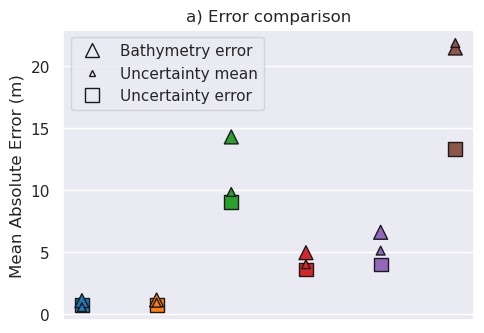

In [240]:
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "uncertainty_mean": uncert_MAs,
        "title": inversion_titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    }
)

fig, ax1 = plt.subplots(figsize=(5, 3.5))
# ax2 = ax1.twinx()

ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_MAE",
    color=sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    marker="s",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="inversion_MAE",
    color=sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    marker="^",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_mean",
    color=sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    marker="^",
    s=40,
    edgecolor="k",
)
# ax1.set_ylabel("■ Uncertainty RMSE (m)")
# ax2.set_ylabel("▲ Bathymetry RMSE (m)")
ax1.set_ylabel("Mean Absolute Error (m)")

# ax1.set_xticks(ax1.get_xticks())
# ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
ax1.set_xticks([])
plt.title("a) Error comparison")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry error",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
uncert_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty error",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
uncert_mean_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty mean",
    marker="^",
    markersize=5,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label, uncert_mean_label, uncert_label])

plt.tight_layout()

plt.savefig("../../paper/figures/Ross_Sea_inversion_errors.png")
plt.show()

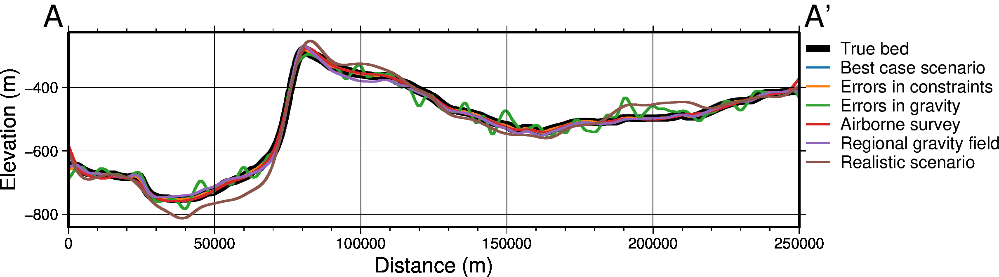

In [235]:
# topography dictionary
topo_names = ["True bed", *inversion_titles]
topo_grids = [bathymetry, *final_bathymetries]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        "black",
        *colors,
        # "216/48/52", # red, d83034
        # "0/58/125", # dark blue, 003a7d
        # "78/203/141", # green, 4ecb8d
        # "255/157/58", # orange, ff9d3a
        # "199/1/255", # purple, c701ff
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=4,
    fig_width=15,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.05,
    # layers_ylims=[-700, -200],
    layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_box=None,
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lElevation (m)"],
    layers_pen_thickness=[4, *[1.2] * len(inversion_titles)],
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
fig.savefig("../../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()

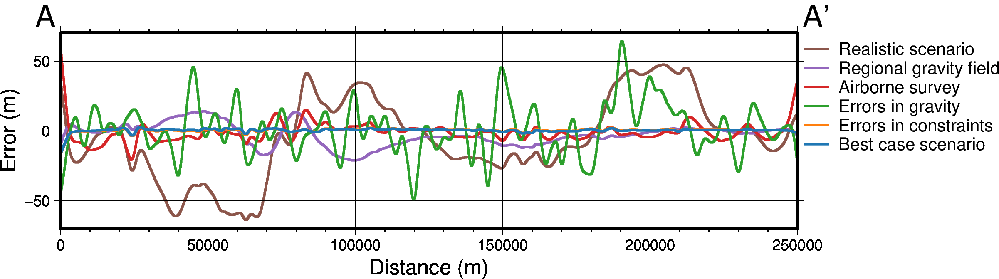

In [236]:
# topography dictionary
topo_names = inversion_titles[::-1]
topo_grids = [x-bathymetry for x in final_bathymetries][::-1]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        *colors[0:len(topo_grids)][::-1],
        # "216/48/52", # red, d83034
        # "0/58/125", # dark blue, 003a7d
        # "78/203/141", # green, 4ecb8d
        # "255/157/58", # orange, ff9d3a
        # "199/1/255", # purple, c701ff
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=4,
    fig_width=15,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.05,
    # layers_ylims=[-700, -200],
    layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_box=None,
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lError (m)"],
    layers_pen_thickness=[1.2] * len(inversion_titles),
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
# fig.savefig("../../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()